In [4]:
!pip install tqdm
!pip install keras
!pip install pillow
!pip install pandas
!pip install seaborn
!pip install matplotlib
!pip install tensorflow
!pip install pydot graphviz
!pip install psutil
!pip install graphviz pydot
!pip install visualkeras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.7/993.7 kB 20.2 MB/s eta 0:00:0000:01


In [5]:
import os
import cv2
import time
import psutil
import pydot
import pickle
import tensorflow
import visualkeras
import numpy as np
%matplotlib inline
import pandas as pd
np.random.seed(1000)
import seaborn as sns
from tqdm import tqdm
import tensorflow as tf
import tensorflow.keras
from tensorflow import keras
from sklearn import datasets
from keras import optimizers
from PIL import Image,ImageOps
import matplotlib.pyplot as plt
from IPython.display import Image
from tensorflow.keras import Model
from keras.models import Sequential
from tensorflow.keras import layers
from keras.preprocessing import image
os.environ['TFF_CPP_MIN_LOG_LEVEL'] = '2'
from tensorflow.keras import models, layers
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import plot_model
from sklearn.tree import DecisionTreeClassifier


from tensorflow.keras.utils import img_to_array
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.optimizers import SGD, RMSprop
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc, precision_recall_curve

from sklearn.metrics import accuracy_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D
from tensorflow.keras.models import Model, model_from_json, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.layers import Input, BatchNormalization, ReLU, ELU, Dropout, Conv2D, Dense, MaxPool2D, AvgPool2D, GlobalAvgPool2D, Concatenate
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D, SeparableConv2D, UpSampling2D, BatchNormalization, Input, GlobalAveragePooling2D

In [6]:
dataset='/kaggle/input/rice-dataset-4/Rice_Leaf_Diease'

train_folder = os.path.join(dataset,"train")
test_folder = os.path.join(dataset,"test")

In [7]:
categories = []
for i in os.listdir(train_folder):
    categories.append(i)
print(categories)

['neck_blast', 'tungro', 'bacterial_leaf_blight', 'sheath_blight', 'brown_spot', 'healthy', 'narrow_brown_spot', 'leaf_scald', 'leaf_blast', 'rice_hispa']


In [8]:
epochs = 100
img_size = 144
batch_size = 64
num_categories = len(categories)

In [9]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

def load_data(data_path, image_size, batch_size):
    transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])

    train_dataset = ImageFolder(os.path.join(data_path, 'train'), transform=transform)
    # val_dataset = ImageFolder(os.path.join(data_path, 'valid'), transform=transform)
    test_dataset = ImageFolder(os.path.join(data_path, 'test'), transform=transform)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    # val_loader = DataLoader(val_dataset, batch_size=batch_size, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, num_workers=4)

    print(f"Classes: {train_dataset.classes}")
    return train_loader, test_loader, train_dataset.classes



batch_size = 32

train_loader, test_loader, classes = load_data(dataset, img_size, batch_size)

Classes: ['bacterial_leaf_blight', 'brown_spot', 'healthy', 'leaf_blast', 'leaf_scald', 'narrow_brown_spot', 'neck_blast', 'rice_hispa', 'sheath_blight', 'tungro']


In [10]:
import pandas as pd

def count_images_per_class(data_loader, classes):
    class_counts = {cls: 0 for cls in classes}
    for images, labels in data_loader:
        for label in labels:
            class_counts[classes[label]] += 1
    return class_counts

train_counts = count_images_per_class(train_loader, classes)
test_counts = count_images_per_class(test_loader, classes)


train_df = pd.DataFrame({'Class': list(train_counts.keys()), 'Train Count': list(train_counts.values())})
test_df = pd.DataFrame({'Class': list(test_counts.keys()), 'Test Count': list(test_counts.values())})


merged_df = pd.merge(train_df, test_df, on='Class')
merged_df

,Class,Train Count,Test Count
0,bacterial_leaf_blight,1400,350
1,brown_spot,1400,350
2,healthy,1400,350
3,leaf_blast,1400,350
4,leaf_scald,1400,350
5,narrow_brown_spot,1400,350
6,neck_blast,1400,350
7,rice_hispa,1400,350
8,sheath_blight,1400,350
9,tungro,1400,350


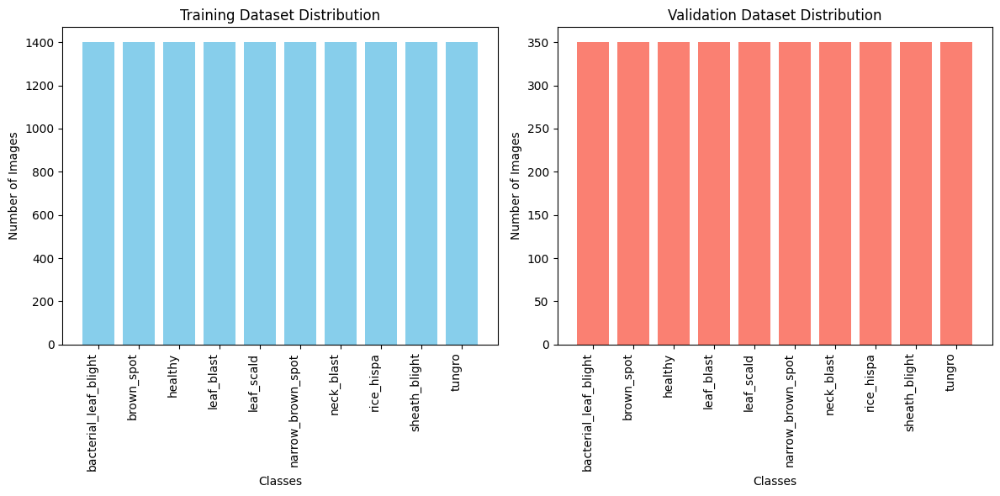

In [11]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.bar(merged_df['Class'], merged_df['Train Count'], color='skyblue')
plt.xlabel("Classes")
plt.ylabel("Number of Images")
plt.title("Training Dataset Distribution")
plt.xticks(rotation=90, ha='right')  # Rotate x-axis labels for better readability


plt.subplot(1, 2, 2)
plt.bar(merged_df['Class'], merged_df['Test Count'], color='salmon')
plt.xlabel("Classes")
plt.ylabel("Number of Images")
plt.title("Validation Dataset Distribution")
plt.xticks(rotation=90, ha='right')  # Rotate x-axis labels

plt.tight_layout()
plt.show()

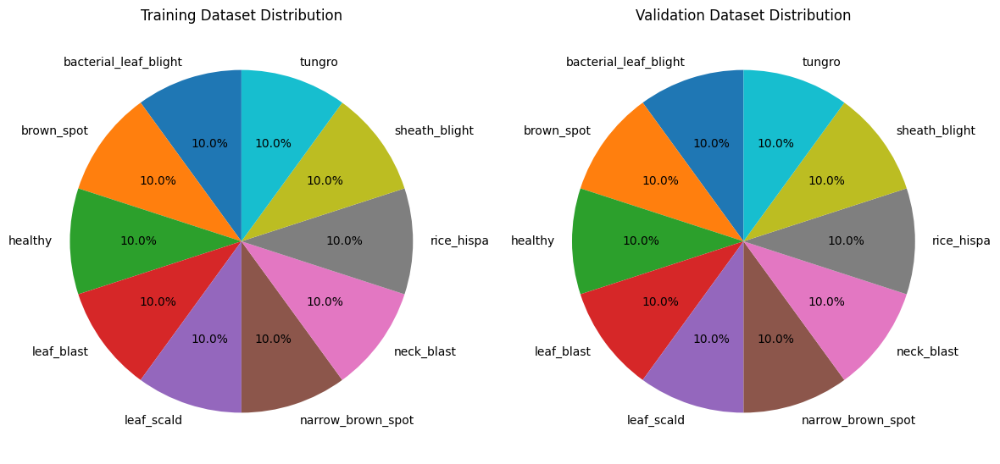

In [12]:
# Calculate percentages
merged_df['Train Percentage'] = (merged_df['Train Count'] / merged_df['Train Count'].sum()) * 100
merged_df['Validation Percentage'] = (merged_df['Test Count'] / merged_df['Test Count'].sum()) * 100

# Create the pie chart
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.pie(merged_df['Train Percentage'], labels=merged_df['Class'], autopct='%1.1f%%', startangle=90)
plt.title("Training Dataset Distribution")


plt.subplot(1, 2, 2)
plt.pie(merged_df['Validation Percentage'], labels=merged_df['Class'], autopct='%1.1f%%', startangle=90)
plt.title("Validation Dataset Distribution")

plt.tight_layout()
plt.show()

In [13]:


def process_data(folder, categories, img_size):
    data = []
    class_counts = {category: 0 for category in categories}
    for c in categories:
        path = os.path.join(folder, c)
        class_num = categories.index(c)
        for img in tqdm(os.listdir(path), desc=f"Processing {c}"):
            try:
                img_array = cv2.imread(os.path.join(path, img))
                img_resized = cv2.resize(img_array, (img_size, img_size))
                data.append([img_resized, class_num])
                class_counts[c] += 1
            except Exception as e:
                pass
        print(f"Class '{c}' has {class_counts[c]} images")
    return data, class_counts

In [14]:
def process_and_print_data(folder, data_type, categories, img_size):
    """Process and print data information for training or validation data."""
    print(f"{data_type} Data:")
    data, class_counts = process_data(folder, categories, img_size)
    print(f"Total {data_type.lower()} data: {len(data)}\n")
    return data, class_counts


training_data, train_class_counts = process_and_print_data(train_folder, "Training", categories, img_size)


validation_data, val_class_counts = process_and_print_data(test_folder, "Validation", categories, img_size)


Training Data:


Processing neck_blast: 100%|██████████| 1400/1400 [01:28<00:00, 15.78it/s]


Class 'neck_blast' has 1400 images


Processing tungro: 100%|██████████| 1400/1400 [00:04<00:00, 342.51it/s]


Class 'tungro' has 1400 images


Processing bacterial_leaf_blight: 100%|██████████| 1400/1400 [00:12<00:00, 109.33it/s]


Class 'bacterial_leaf_blight' has 1400 images


Processing sheath_blight: 100%|██████████| 1400/1400 [00:15<00:00, 87.68it/s] 


Class 'sheath_blight' has 1400 images


Processing brown_spot: 100%|██████████| 1400/1400 [00:13<00:00, 104.75it/s]


Class 'brown_spot' has 1400 images


Processing healthy: 100%|██████████| 1400/1400 [00:23<00:00, 60.12it/s]


Class 'healthy' has 1400 images


Processing narrow_brown_spot: 100%|██████████| 1400/1400 [00:12<00:00, 113.51it/s]


Class 'narrow_brown_spot' has 1400 images


Processing leaf_scald: 100%|██████████| 1400/1400 [00:12<00:00, 116.07it/s]


Class 'leaf_scald' has 1400 images


Processing leaf_blast: 100%|██████████| 1400/1400 [00:14<00:00, 99.74it/s] 


Class 'leaf_blast' has 1400 images


Processing rice_hispa: 100%|██████████| 1400/1400 [00:13<00:00, 100.27it/s]


Class 'rice_hispa' has 1400 images
Total training data: 14000

Validation Data:


Processing neck_blast: 100%|██████████| 350/350 [00:21<00:00, 16.27it/s]


Class 'neck_blast' has 350 images


Processing tungro: 100%|██████████| 350/350 [00:01<00:00, 183.46it/s]


Class 'tungro' has 350 images


Processing bacterial_leaf_blight: 100%|██████████| 350/350 [00:03<00:00, 108.33it/s]


Class 'bacterial_leaf_blight' has 350 images


Processing sheath_blight: 100%|██████████| 350/350 [00:08<00:00, 40.36it/s]


Class 'sheath_blight' has 350 images


Processing brown_spot: 100%|██████████| 350/350 [00:03<00:00, 102.93it/s]


Class 'brown_spot' has 350 images


Processing healthy: 100%|██████████| 350/350 [00:04<00:00, 75.66it/s]


Class 'healthy' has 350 images


Processing narrow_brown_spot: 100%|██████████| 350/350 [00:03<00:00, 116.10it/s]


Class 'narrow_brown_spot' has 350 images


Processing leaf_scald: 100%|██████████| 350/350 [00:02<00:00, 120.76it/s]


Class 'leaf_scald' has 350 images


Processing leaf_blast: 100%|██████████| 350/350 [00:03<00:00, 99.16it/s] 


Class 'leaf_blast' has 350 images


Processing rice_hispa: 100%|██████████| 350/350 [00:06<00:00, 54.76it/s]

Class 'rice_hispa' has 350 images
Total validation data: 3500



/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


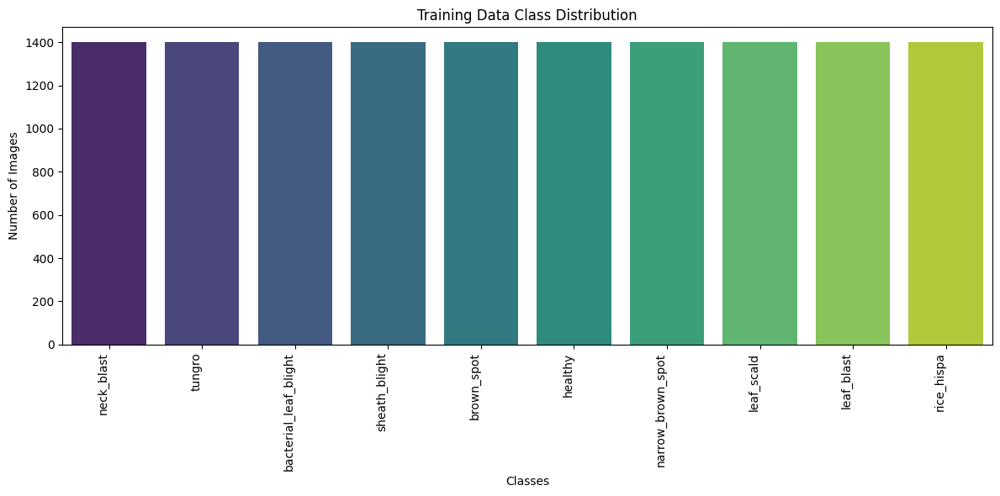

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


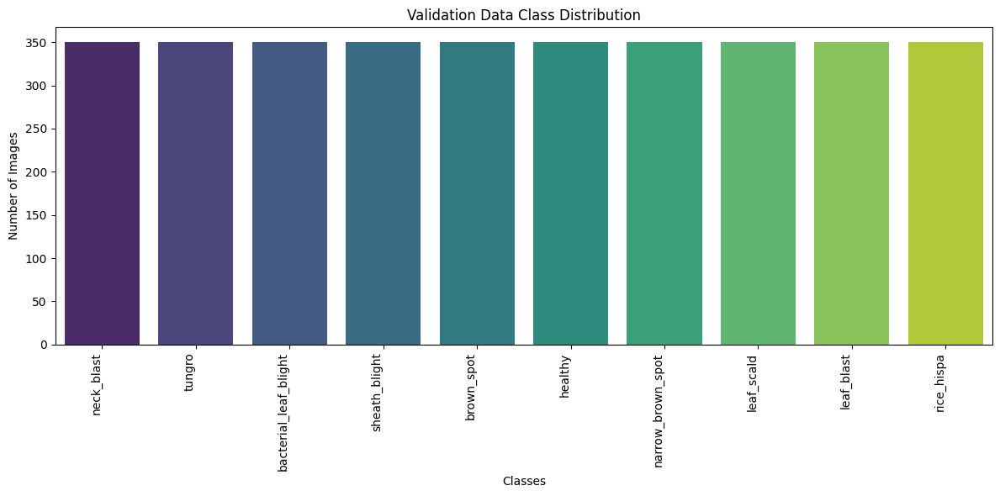

In [15]:

def plot_class_distribution(class_counts, title):
  """Plots the distribution of classes in a dataset."""
  plt.figure(figsize=(12, 6))
  sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette='viridis')

  plt.title(title)
  plt.xlabel("Classes")
  plt.ylabel("Number of Images")
  plt.xticks(rotation=90, ha='right')
  plt.tight_layout()

  plt.show()



plot_class_distribution(train_class_counts, "Training Data Class Distribution")


plot_class_distribution(val_class_counts, "Validation Data Class Distribution")


In [16]:
X_train = []
Y_train = []

for img, label in training_data:
    X_train.append(img)
    Y_train.append(label)

X_train = np.array(X_train).astype('float32').reshape(-1, img_size, img_size, 3)
Y_train = np.array(Y_train)

print(f"X_train= {X_train.shape} Y_train= {Y_train.shape}")

X_train= (14000, 144, 144, 3) Y_train= (14000,)


In [17]:
X_test = []
Y_test = []

for features,label in validation_data:
    X_test.append(features)
    Y_test.append(label)

X_test = np.array(X_test).astype('float32').reshape(-1, img_size, img_size, 3)
Y_test = np.array(Y_test)

print(f"X_test= {X_test.shape} Y_test= {Y_test.shape}")
X_train, X_test = X_train / 255.0, X_test / 255.0

X_test= (3500, 144, 144, 3) Y_test= (3500,)


Class: neck_blast


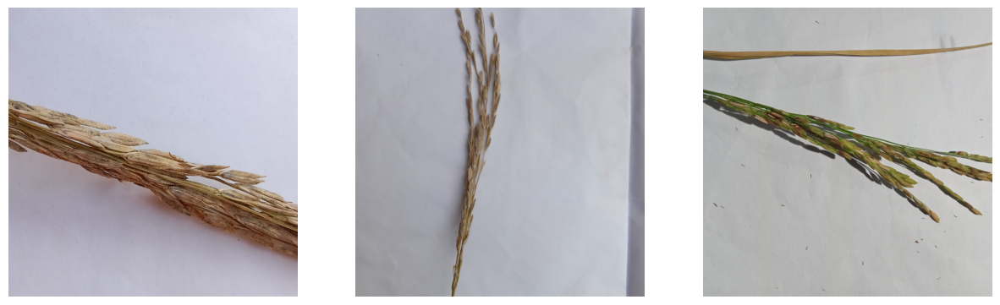

Class: tungro


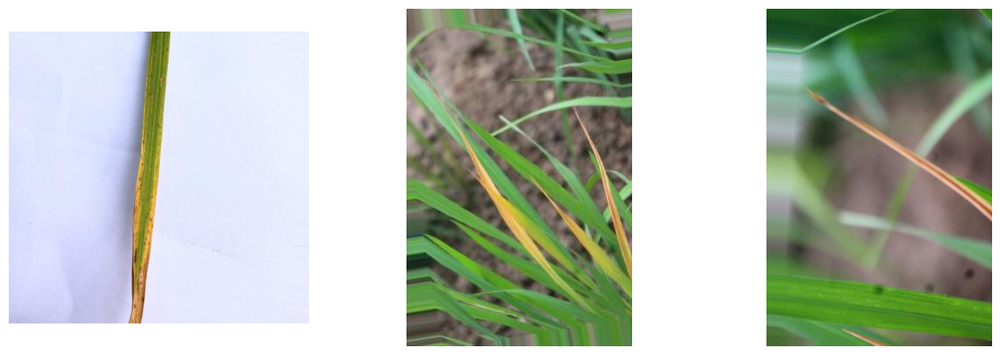

Class: bacterial_leaf_blight


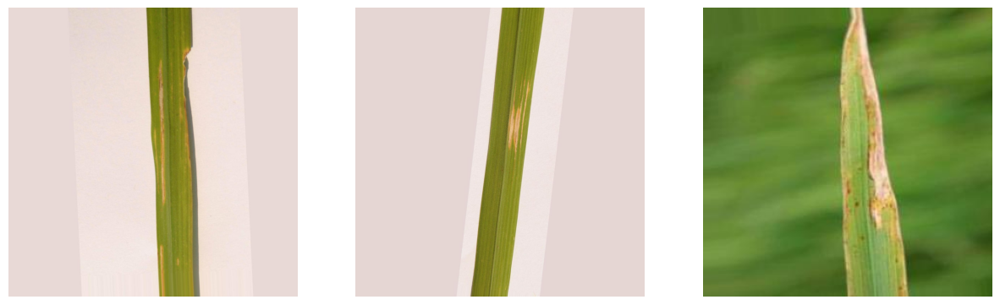

Class: sheath_blight


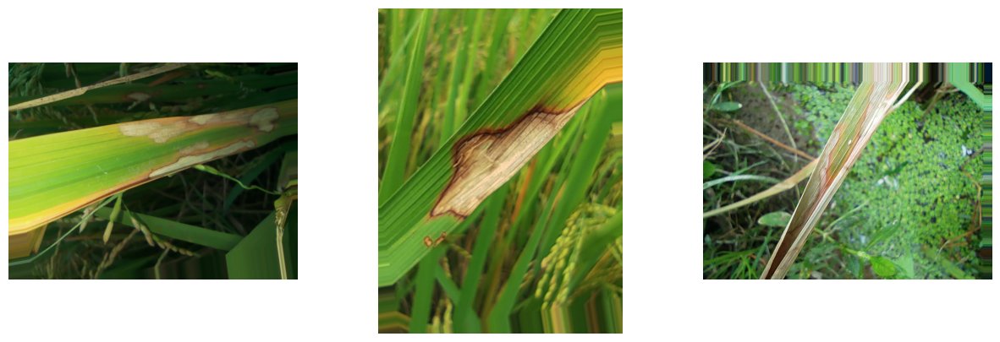

Class: brown_spot


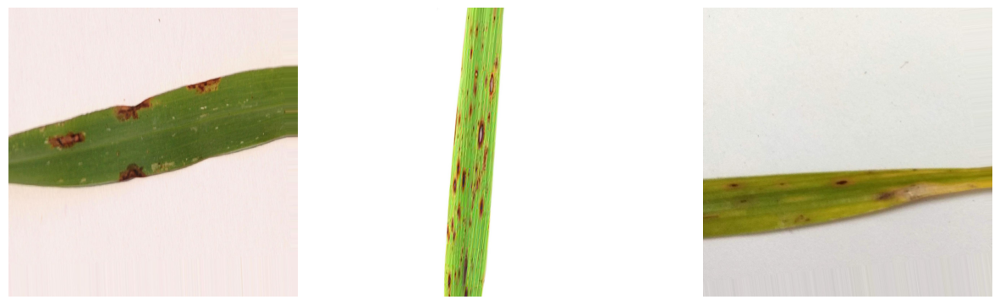

Class: healthy


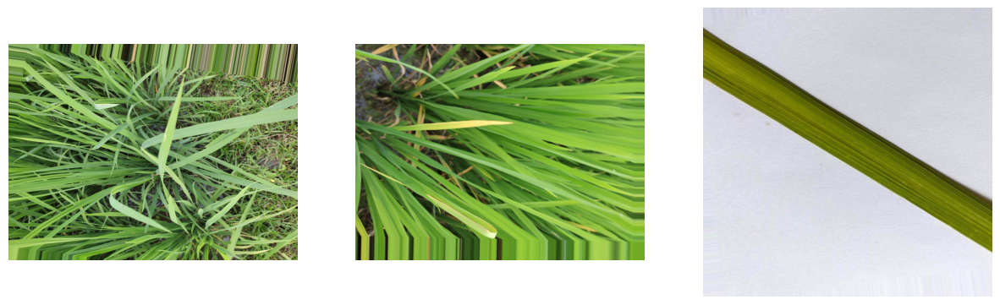

Class: narrow_brown_spot


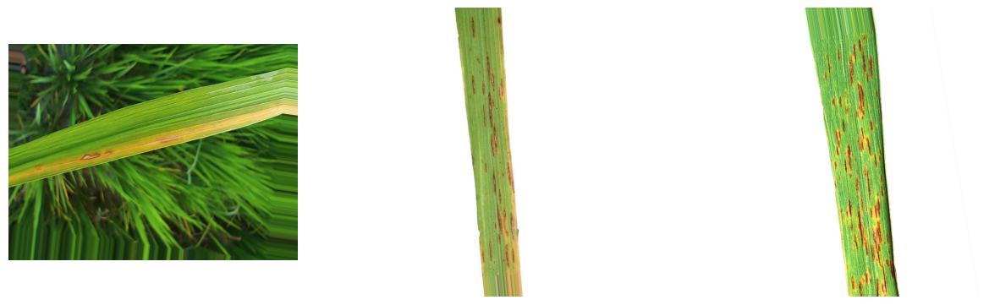

Class: leaf_scald


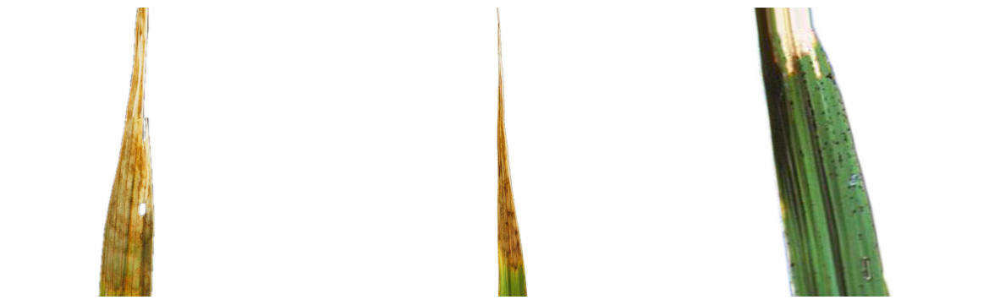

Class: leaf_blast


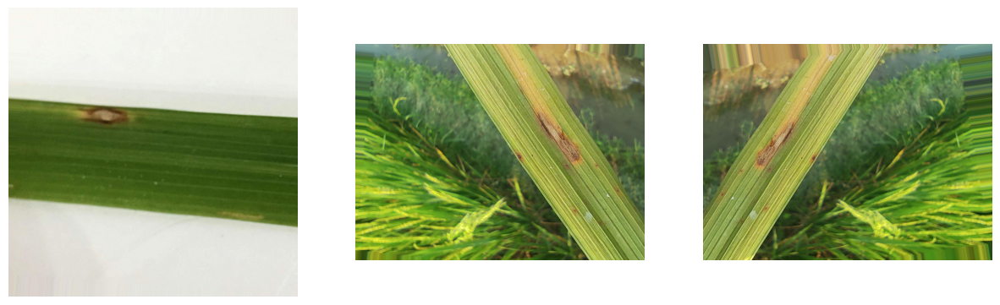

Class: rice_hispa


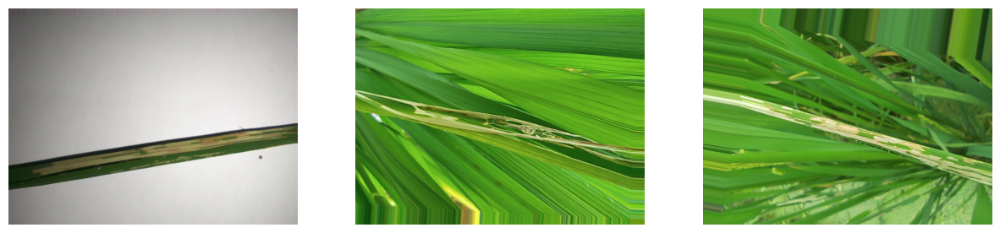

In [18]:
def show_class_images(train_folder, categories, num_images_per_class=3):
  """Shows sample images from each class."""
  for category in categories:
    path = os.path.join(train_folder, category)
    print(f"Class: {category}")
    image_files = os.listdir(path)[:num_images_per_class]
    plt.figure(figsize=(15, 5))
    for i, img_file in enumerate(image_files):
      img_path = os.path.join(path, img_file)
      img = plt.imread(img_path)
      plt.subplot(1, num_images_per_class, i + 1)
      plt.imshow(img)
      plt.axis('off')
    plt.show()


show_class_images(train_folder, categories)


In [19]:
# del model_cnn
# import tensorflow as tf
# tf.keras.backend.clear_session()
# import gc
# gc.collect()

Proposed Alexnet

In [20]:
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Optimized CNN Model
model_cnn = keras.Sequential([
    # Block 1
    layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', 
                  kernel_regularizer=regularizers.l2(1e-4), input_shape=(img_size, img_size, 3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),

    # Block 2
    layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', 
                  kernel_regularizer=regularizers.l2(1e-4)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),

    # Block 3
    layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', 
                  kernel_regularizer=regularizers.l2(1e-4)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),

    # Block 4
    layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', 
                  kernel_regularizer=regularizers.l2(1e-4)),
    layers.BatchNormalization(),
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.4),

    # Dense Layers
    layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(1e-4)),
    layers.BatchNormalization(),
    layers.Dropout(0.4),

    layers.Dense(num_categories, activation='softmax')
])

model_cnn.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 144, 144, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 144, 144, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 72, 72, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 72, 72, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 72, 72, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 36, 36, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 36, 36, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 36, 36, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 36, 36, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 18, 18, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 18, 18, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 18, 18, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 18, 18, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 1,824,650 (6.96 MB)

 Trainable params: 1,821,706 (6.95 MB)

 Non-trainable params: 2,944 (11.50 KB)

In [17]:
model_cnn.compile(
    optimizer=keras.optimizers.Adam(learning_rate=5e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)


In [18]:
from keras.callbacks import ModelCheckpoint

cnn_model_path = '/kaggle/working/'
n_cycles = 5
epochs_per_cycle = epochs
snapshot_dir = f'{cnn_model_path}/snapshots'
# snapshot_dir = '/content/drive/MyDrive/V_6(aug)/snapshots'
os.makedirs(snapshot_dir, exist_ok=True)


for cycle in range(n_cycles):
    checkpoint = ModelCheckpoint(
        filepath=os.path.join(snapshot_dir, f'snapshot_cycle_{cycle + 1}.keras'),
        monitor='val_accuracy',
        mode='max',
        save_best_only=True,
        save_weights_only=False
    )

In [19]:

    print(f"Training Cycle {cycle + 1}/{n_cycles}")
    cnn_history = model_cnn.fit( X_train, Y_train, epochs = epochs_per_cycle, validation_data=(X_test, Y_test), batch_size=32, callbacks=[checkpoint] )


Training Cycle 5/5
Epoch 1/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 37s 57ms/step - accuracy: 0.4710 - loss: 2.0059 - val_accuracy: 0.5197 - val_loss: 1.7058
Epoch 2/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.6668 - loss: 1.2840 - val_accuracy: 0.7563 - val_loss: 1.0932
Epoch 3/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.7219 - loss: 1.1144 - val_accuracy: 0.7329 - val_loss: 1.1498
Epoch 4/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - accuracy: 0.7577 - loss: 0.9771 - val_accuracy: 0.7603 - val_loss: 1.1183
Epoch 5/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.7682 - loss: 0.9338 - val_accuracy: 0.7603 - val_loss: 1.0477
Epoch 6/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.7975 - loss: 0.8476 - val_accuracy: 0.7951 - val_loss: 0.9074
Epoch 7/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.8122 - loss: 0.7912 - val_accuracy: 0.8089 - val_loss: 0.8539
Epoch 8/100
438/438 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accurac

In [22]:

test_loss, test_acc, *_ = model_cnn.evaluate(X_test, Y_test) # Use _ to ignore additional return values
train_loss, train_acc, *_=model_cnn.evaluate(X_train, Y_train) # Use _ to ignore additional return values

print("\n....................TRAIN ACCURACY.....................")


cnn_train_accuracy = train_acc
print('\nTrain Accuracy:', train_acc)

cnn_train_loss = train_loss
print('Train Loss:', cnn_train_loss)


print("\n....................TEST ACCURACY.....................")

cnn_test_accuracy = test_acc
print('\nTest Accuracy:', cnn_test_accuracy)

cnn_test_loss = test_loss
print('Test Loss:', cnn_test_loss)



110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9812 - loss: 0.2837
438/438 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.9985 - loss: 0.1849

....................TRAIN ACCURACY.....................

Train Accuracy: 0.9977856874465942
Train Loss: 0.18707655370235443

....................TEST ACCURACY.....................

Test Accuracy: 0.9745714068412781
Test Loss: 0.3191429376602173


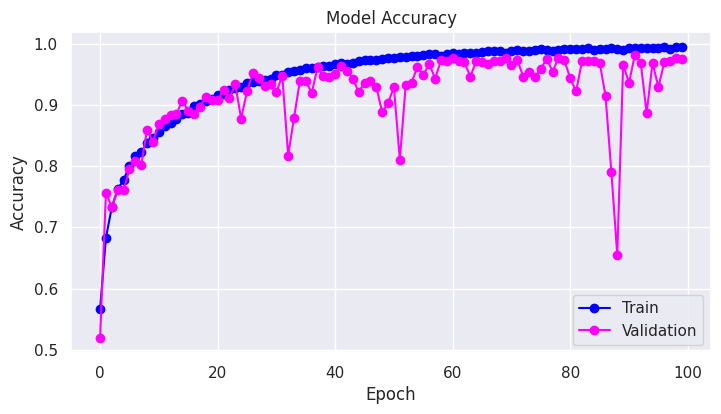

In [24]:
import seaborn as sns
#  "Accuracy"
plt.figure(figsize=[8, 4])
sns.set_theme()
plt.plot(cnn_history.history['accuracy'], 'o-',color="blue")
plt.plot(cnn_history.history['val_accuracy'] ,'o-', color="magenta")
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
#plt.show()
plt.gca().set_position([0.1, 0.12, 0.8, 0.8])
#plt.close()

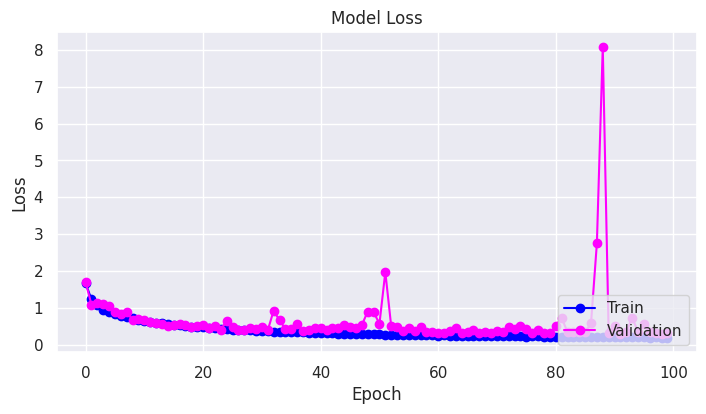

In [25]:
import seaborn as sns
#  "Accuracy"
plt.figure(figsize=[8, 4])
sns.set_theme()
plt.plot(cnn_history.history['loss'], 'o-',color="blue")
plt.plot(cnn_history.history['val_loss'] ,'o-', color="magenta")
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
#plt.show()
plt.gca().set_position([0.1, 0.12, 0.8, 0.8])
#plt.close()



In [28]:
model_cnn.save('cnn_model.h5')  # Save the model to an HDF5 file
model_cnn.save('proposed_cnn_model.keras')

In [29]:
# from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def load_snapshots_and_predict(snapshot_dir, X_test):
    predictions = []
    snapshot_files = sorted([os.path.join(snapshot_dir, f) for f in os.listdir(snapshot_dir) if f.endswith('.keras')])

    if len(snapshot_files) == 0:
        raise ValueError("No snapshot files found in the directory.")

    for snapshot_file in snapshot_files:
        print(f"Loading model from {snapshot_file}...")
        model = tf.keras.models.load_model(snapshot_file, )
        pred = model.predict(X_test)

        print(f"Prediction shape from model {snapshot_file}: {pred.shape}")
        predictions.append(pred)

    if len(predictions) == 0:
        raise ValueError("No predictions were generated from the snapshot models.")

    final_prediction = np.max(predictions, axis=0)
    print(f"Final prediction shape: {final_prediction.shape}")

    return np.argmax(final_prediction, axis=-1)



try:
    Y_pred = load_snapshots_and_predict(snapshot_dir, X_test)


    print("Calculating ensemble accuracy...")
    ensemble_accuracy = accuracy_score(Y_test, Y_pred)


    print(f"Ensemble Accuracy: {ensemble_accuracy * 100:.2f}%")
 
except ValueError as e:
    print(f"Error during prediction or accuracy calculation: {e}")



Loading model from /kaggle/working//snapshots/snapshot_cycle_5.keras...
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step
Prediction shape from model /kaggle/working//snapshots/snapshot_cycle_5.keras: (3500, 10)
Final prediction shape: (3500, 10)
Calculating ensemble accuracy...
Ensemble Accuracy: 98.17%


In [30]:

# Load the saved model from the snapshot
cnn_save_model = tf.keras.models.load_model('/kaggle/working/proposed_cnn_model.keras')

# Make predictions
Y_pred_prob = cnn_save_model.predict(X_test)

# Convert predicted probabilities to class labels
Y_pred = np.argmax(Y_pred_prob, axis=-1)

# Generate and print the classification report
print("Classification Report:\n")
print(classification_report(Y_test, Y_pred, target_names=categories))



/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 24 variables whereas the saved optimizer has 46 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
Classification Report:

                       precision    recall  f1-score   support

           neck_blast       1.00      1.00      1.00       350
               tungro       0.99      1.00      1.00       350
bacterial_leaf_blight       1.00      1.00      1.00       350
        sheath_blight       1.00      0.89      0.94       350
           brown_spot       0.97      0.96      0.96       350
              healthy       0.97      0.97      0.97       350
    narrow_brown_spot       0.94      0.99      0.96       350
           leaf_scald       0.97      1.00      0.99       350
           leaf_blast       0.96      0.96      0.96       350
           rice_hispa       0.95      0.98      0.96       350

             accuracy                           0.97      3500
            macro avg       0.98      0.97      0.97      3500
         weighted avg       0.98      0.97      0.97      3500



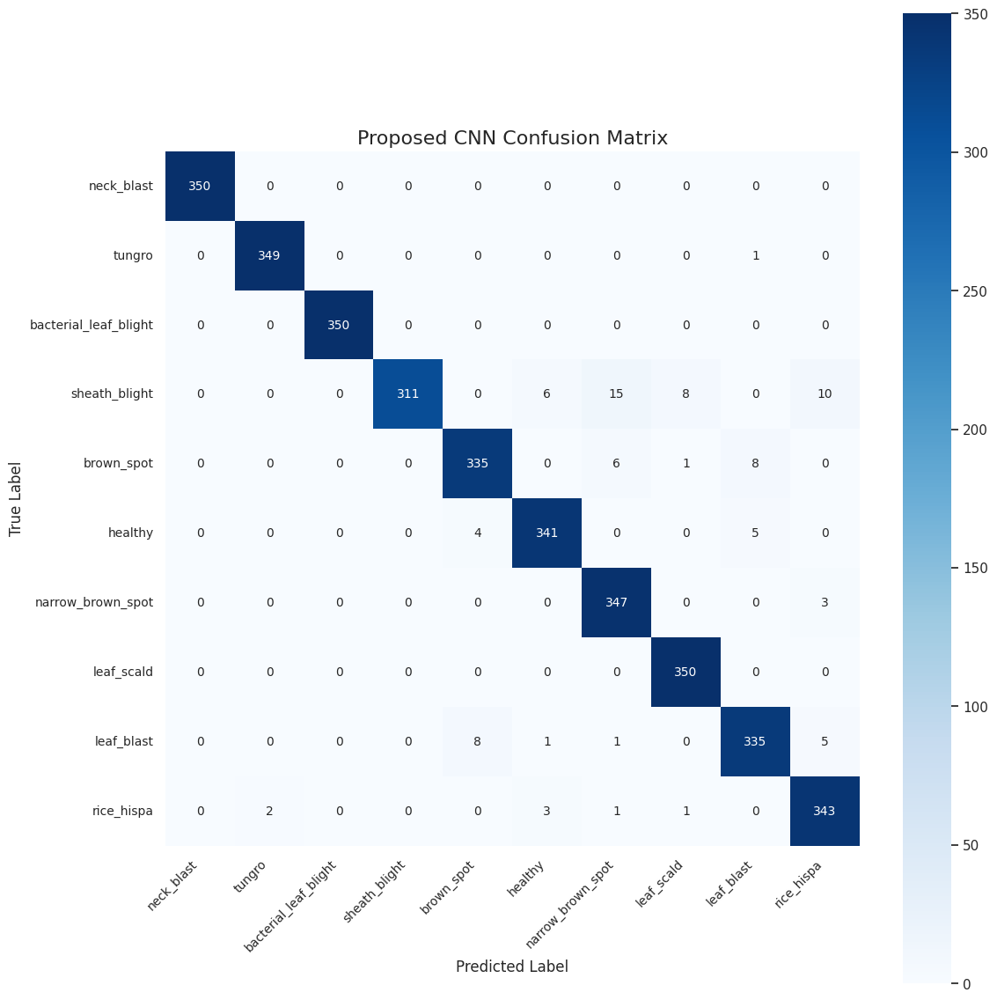

In [31]:

# Generate the confusion matrix
cm = confusion_matrix(Y_test, Y_pred)
cm_df = pd.DataFrame(cm, index=categories, columns=categories)

# Plot and save the confusion matrix with enhanced styling
plt.figure(figsize=(12, 12))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', cbar=True, square=True,
            annot_kws={"size": 10}, linewidths=0.0, linecolor='gray')

plt.title('Proposed CNN Confusion Matrix', fontsize=16)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Save and display the plot
plt.tight_layout()
plt.show()


110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


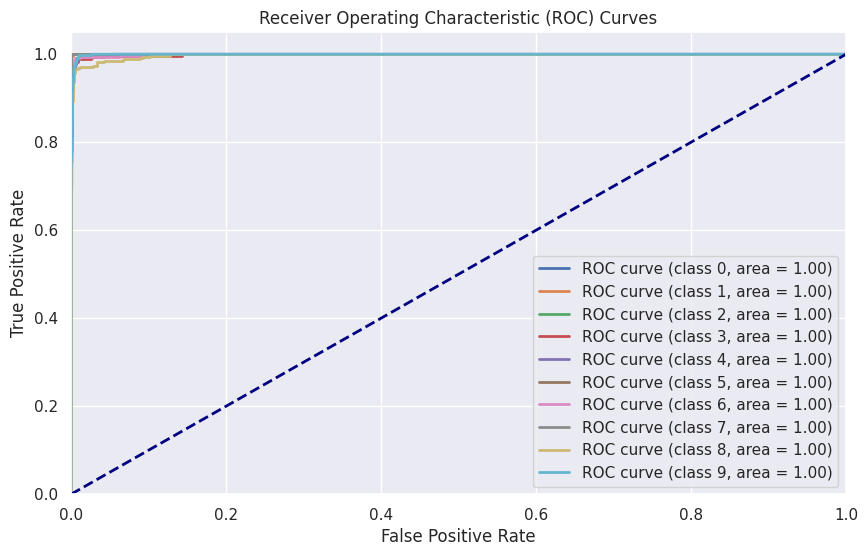

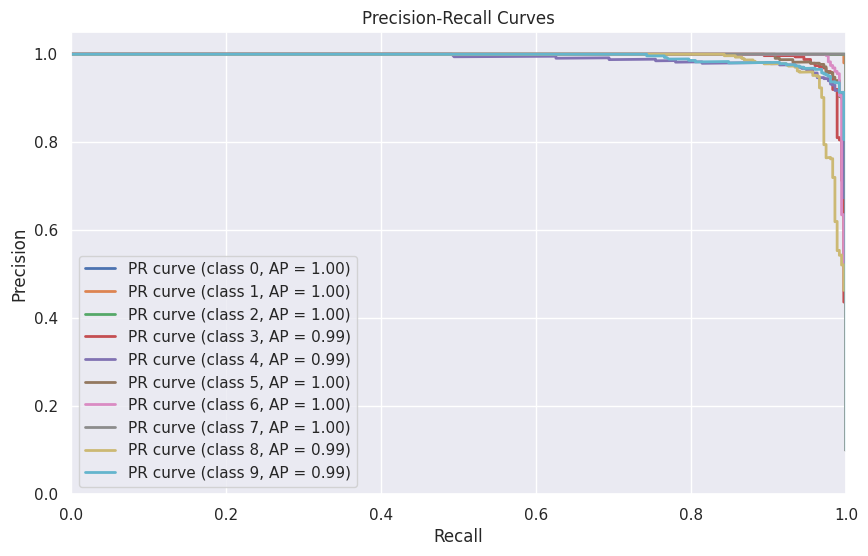

In [32]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve
bcnn_model_output = cnn_save_model.predict(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
precision = dict()
recall = dict()
average_precision = dict()

for i in range(num_categories):
    fpr[i], tpr[i], _ = roc_curve(Y_test == i, bcnn_model_output[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    precision[i], recall[i], _ = precision_recall_curve(Y_test == i, bcnn_model_output[:, i])
    average_precision[i] = auc(recall[i], precision[i])

# Plot ROC curves
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
for i in range(num_categories):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve (class {i}, area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="best")
plt.show()

# Plot PR curves
plt.figure(figsize=(10, 6))
for i in range(num_categories):
    plt.plot(recall[i], precision[i], lw=2, label=f'PR curve (class {i}, AP = {average_precision[i]:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend(loc="best")
plt.show()

Efficientnet B3

In [39]:
!pip install -q efficientnet

/usr/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.8 MB/s eta 0:00:00


In [40]:
import efficientnet.tfkeras as efn
import tensorflow as tf

# Load EfficientNetB3
enet = efn.EfficientNetB3(
    input_shape=(img_size, img_size, 3),
    weights='imagenet',
    include_top=False
)


for layer in enet.layers:
    # Unfreeze layers in block 6 and block 7
    if 'block6' in layer.name or 'block7' in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False
        

# Add a Global Average Pooling layer
x = tf.keras.layers.GlobalAveragePooling2D()(enet.output)

x = tf.keras.layers.Dense(128, activation='relu',kernel_regularizer=l2(0.01))(x)
# x = tf.keras.layers.GlobalMaxPooling2D()(x)
x = tf.keras.layers.Dense(1024, activation='relu',kernel_regularizer=l2(0.01))(x)
x = tf.keras.layers.Dense(1024, activation='relu',kernel_regularizer=l2(0.01))(x)

y = tf.keras.layers.Dense(num_categories, activation='softmax')(x)
e_model_b3 = tf.keras.Model(inputs=enet.input, outputs=y)


44107200/44107200 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [41]:
e_model_b3.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [42]:
efficientnet_b3 = e_model_b3.fit(x=X_train, y=Y_train, epochs=100, validation_data=(X_test, Y_test), batch_size=64)

Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 106s 266ms/step - accuracy: 0.6669 - loss: 7.9724 - val_accuracy: 0.9494 - val_loss: 0.7200
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.9441 - loss: 0.5824 - val_accuracy: 0.9560 - val_loss: 0.3158
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.9653 - loss: 0.2777 - val_accuracy: 0.9766 - val_loss: 0.1968
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.9713 - loss: 0.2238 - val_accuracy: 0.9803 - val_loss: 0.1951
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.9754 - loss: 0.1997 - val_accuracy: 0.9780 - val_loss: 0.1755
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.9808 - loss: 0.1642 - val_accuracy: 0.9791 - val_loss: 0.1560
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.9847 - loss: 0.1439 - val_accuracy: 0.9771 - val_loss: 0.1611
Epoch 8/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.9861 - loss:

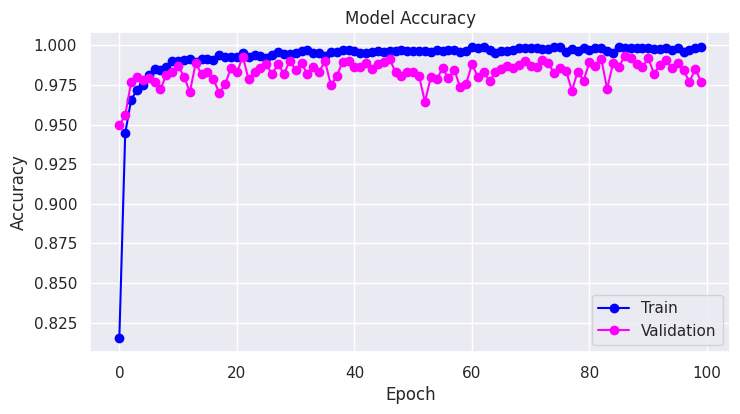

In [43]:
import seaborn as sns
#  "Accuracy"
plt.figure(figsize=[8, 4])
sns.set_theme()
plt.plot(efficientnet_b3.history['accuracy'], 'o-',color="blue")
plt.plot(efficientnet_b3.history['val_accuracy'] ,'o-', color="magenta")
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
#plt.show()
plt.gca().set_position([0.1, 0.12, 0.8, 0.8])
#plt.close()

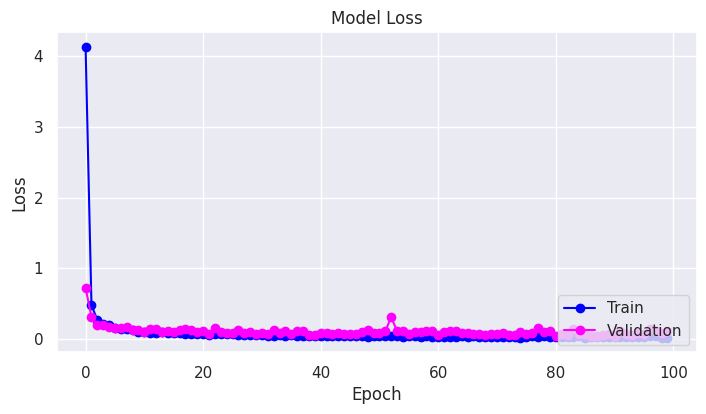

In [44]:
import seaborn as sns
#  "Accuracy"
plt.figure(figsize=[8, 4])
sns.set_theme()
plt.plot(efficientnet_b3.history['loss'], 'o-',color="blue")
plt.plot(efficientnet_b3.history['val_loss'] ,'o-', color="magenta")
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
#plt.show()
plt.gca().set_position([0.1, 0.12, 0.8, 0.8])
#plt.close()



In [48]:

test_loss, test_acc, *_ = e_model_b3.evaluate(X_test, Y_test) # Use _ to ignore additional return values
train_loss, train_acc, *_= e_model_b3.evaluate(X_train, Y_train) # Use _ to ignore additional return values

print("\n....................TRAIN ACCURACY.....................")


# cnn_train_accuracy = train_acc
print('\nTrain Accuracy:', train_acc)

# cnn_train_loss = train_loss
print('Train Loss:', train_loss)


print("\n....................TEST ACCURACY.....................")

# cnn_test_accuracy = test_acc
print('\nTest Accuracy:', test_acc)

# cnn_test_loss = test_loss
print('Test Loss:', test_loss)



110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.9931 - loss: 0.0424
438/438 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 1.0000 - loss: 0.0149

....................TRAIN ACCURACY.....................

Train Accuracy: 0.9999285936355591
Train Loss: 0.015150152146816254

....................TEST ACCURACY.....................

Test Accuracy: 0.9768571257591248
Test Loss: 0.1136016845703125


In [49]:

# Make predictions
Y_pred_prob = e_model_b3.predict(X_test)

# Convert predicted probabilities to class labels
Y_pred = np.argmax(Y_pred_prob, axis=-1)

# Generate and print the classification report
print("Classification Report:\n")
print(classification_report(Y_test, Y_pred, target_names=categories))





110/110 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step
Classification Report:

                       precision    recall  f1-score   support

           neck_blast       1.00      1.00      1.00       350
               tungro       0.99      1.00      0.99       350
bacterial_leaf_blight       1.00      1.00      1.00       350
        sheath_blight       0.91      0.96      0.93       350
           brown_spot       1.00      0.99      1.00       350
              healthy       0.95      0.99      0.97       350
    narrow_brown_spot       0.99      1.00      1.00       350
           leaf_scald       0.98      1.00      0.99       350
           leaf_blast       0.97      0.99      0.98       350
           rice_hispa       0.98      0.83      0.90       350

             accuracy                           0.98      3500
            macro avg       0.98      0.98      0.98      3500
         weighted avg       0.98      0.98      0.98      3500



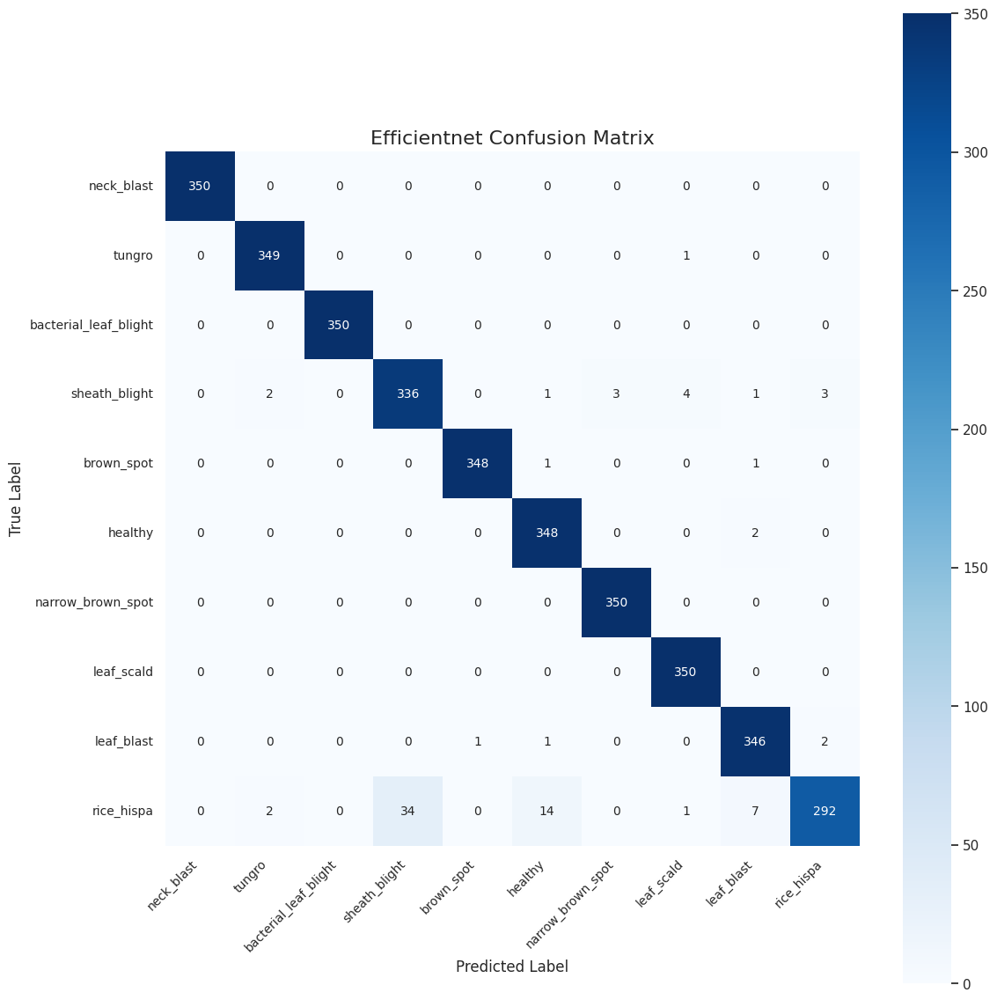

In [50]:

# Generate the confusion matrix
cm = confusion_matrix(Y_test, Y_pred)
cm_df = pd.DataFrame(cm, index=categories, columns=categories)

# Plot and save the confusion matrix with enhanced styling
plt.figure(figsize=(12, 12))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', cbar=True, square=True,
            annot_kws={"size": 10}, linewidths=0.0, linecolor='gray')

plt.title('Efficientnet Confusion Matrix', fontsize=16)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Save and display the plot
plt.tight_layout()
plt.show()


110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step


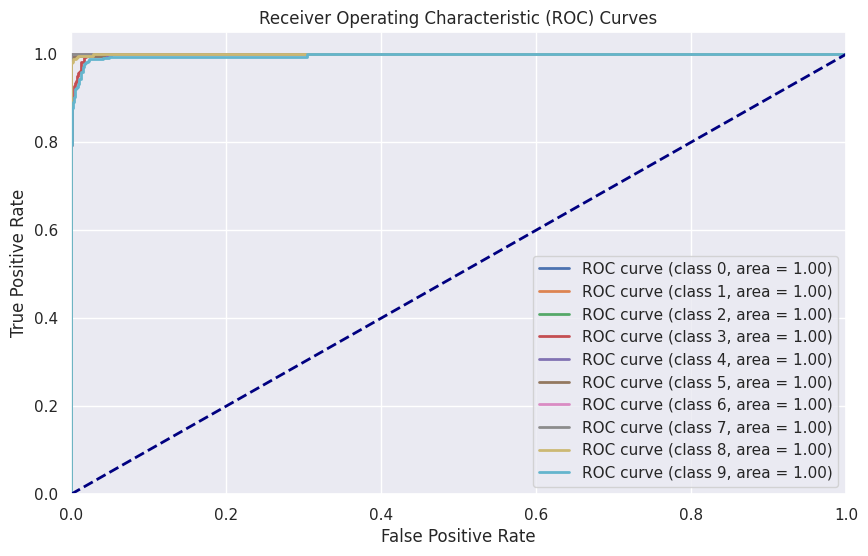

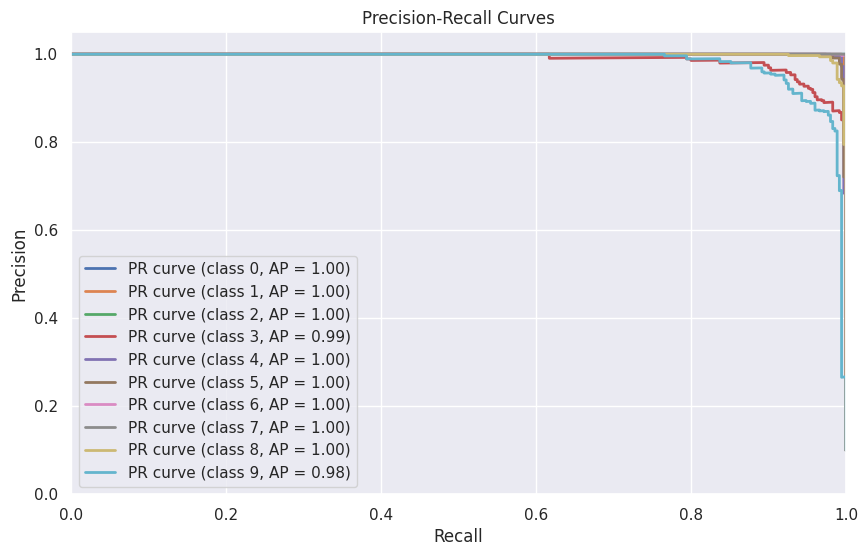

In [51]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve
model_output = e_model_b3.predict(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
precision = dict()
recall = dict()
average_precision = dict()

for i in range(num_categories):
    fpr[i], tpr[i], _ = roc_curve(Y_test == i, model_output[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    precision[i], recall[i], _ = precision_recall_curve(Y_test == i, model_output[:, i])
    average_precision[i] = auc(recall[i], precision[i])

# Plot ROC curves
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
for i in range(num_categories):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve (class {i}, area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="best")
plt.show()

# Plot PR curves
plt.figure(figsize=(10, 6))
for i in range(num_categories):
    plt.plot(recall[i], precision[i], lw=2, label=f'PR curve (class {i}, AP = {average_precision[i]:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend(loc="best")
plt.show()

In [52]:
del enet
import tensorflow as tf
tf.keras.backend.clear_session()
import gc
gc.collect()

0

InceptionV3

In [12]:
import tensorflow as tf

# Load InceptionV3 model without the top (classification) layers
inception = tf.keras.applications.InceptionV3(
    input_shape=(img_size, img_size, 3),
    include_top=False,
    weights='imagenet'  # Use 'None' to load without pre-trained weights
)

# Freeze the base InceptionV3 layers
# inception.trainable = False
for layer in inception.layers[:-20]:  # Keep first layers frozen, fine-tune last 10 layers
    layer.trainable = False
for layer in inception.layers[-20:]:
    layer.trainable = True

# Create your custom classification head
x = tf.keras.layers.GlobalAveragePooling2D()(inception.output)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.5)(x)
y = tf.keras.layers.Dense(num_categories, activation='softmax')(x)

# Combine the base InceptionV3 model with the custom head
inception_model = tf.keras.Model(inputs=inception.input, outputs=y)

inception_model.summary()



87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 144, 144, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 71, 71, 32)     │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 71, 71, 32)     │             96 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 71, 71, 32)     │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 69, 69, 32)     │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 69, 69, 32)     │             96 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 69, 69, 32)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 69, 69, 64)     │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 69, 69, 64)     │            192 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 69, 69, 64)     │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 34, 34, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 34, 34, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 34, 34, 80)     │            240 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 34, 34, 80)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 32, 32, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 32, 32, 192)    │            576 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activat

 Total params: 22,988,842 (87.70 MB)

 Trainable params: 3,119,882 (11.90 MB)

 Non-trainable params: 19,868,960 (75.79 MB)

In [13]:
# Compile the model
inception_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate= 0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)


In [14]:
inceptionv3 = inception_model.fit(
    x=X_train,
    y=Y_train,
    epochs=100,
    validation_data=(X_test, Y_test),
    batch_size=64
)

Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - accuracy: 0.3712 - loss: 2.2241 - val_accuracy: 0.7980 - val_loss: 0.6566
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - accuracy: 0.7022 - loss: 0.9364 - val_accuracy: 0.8560 - val_loss: 0.4119
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - accuracy: 0.7928 - loss: 0.6475 - val_accuracy: 0.8943 - val_loss: 0.3067
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - accuracy: 0.8343 - loss: 0.5046 - val_accuracy: 0.9077 - val_loss: 0.2628
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - accuracy: 0.8717 - loss: 0.3924 - val_accuracy: 0.9189 - val_loss: 0.2302
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - accuracy: 0.8961 - loss: 0.3148 - val_accuracy: 0.9194 - val_loss: 0.2521
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.9141 - loss: 0.2623 - val_accuracy: 0.9331 - val_loss: 0.2050
Epoch 8/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.9306 - loss: 

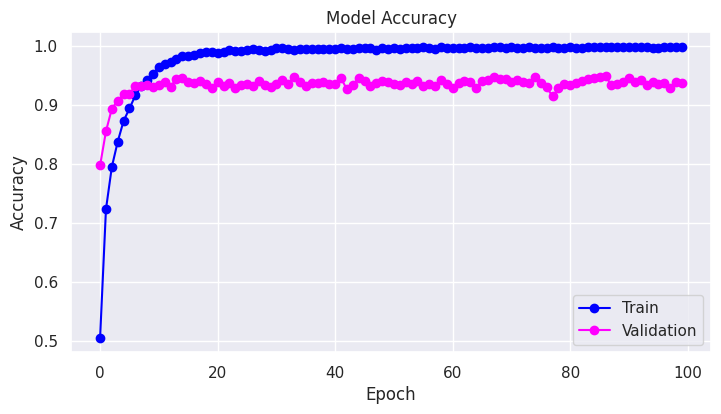

In [15]:
import seaborn as sns
#  "Accuracy"
plt.figure(figsize=[8, 4])
sns.set_theme()
plt.plot(inceptionv3.history['accuracy'], 'o-',color="blue")
plt.plot(inceptionv3.history['val_accuracy'] ,'o-', color="magenta")
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
#plt.show()
plt.gca().set_position([0.1, 0.12, 0.8, 0.8])
#plt.close()

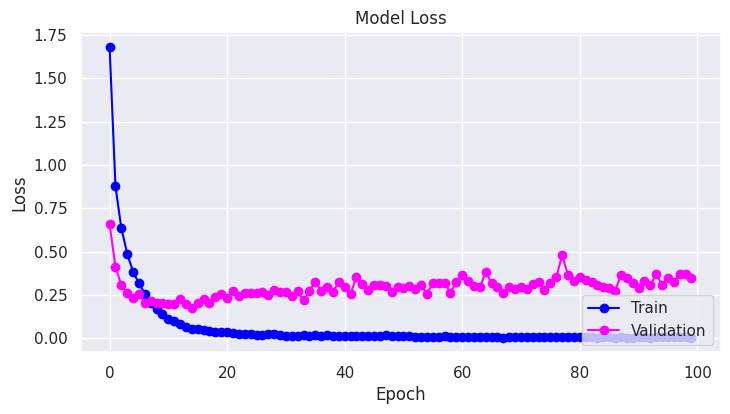

In [16]:
import seaborn as sns
#  "Accuracy"
plt.figure(figsize=[8, 4])
sns.set_theme()
plt.plot(inceptionv3.history['loss'], 'o-',color="blue")
plt.plot(inceptionv3.history['val_loss'] ,'o-', color="magenta")
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
#plt.show()
plt.gca().set_position([0.1, 0.12, 0.8, 0.8])
#plt.close()



In [17]:

test_loss, test_acc, *_ = inception_model.evaluate(X_test, Y_test) # Use _ to ignore additional return values
train_loss, train_acc, *_= inception_model.evaluate(X_train, Y_train) # Use _ to ignore additional return values

print("\n....................TRAIN ACCURACY.....................")


# cnn_train_accuracy = train_acc
print('\nTrain Accuracy:', train_acc)

# cnn_train_loss = train_loss
print('Train Loss:', train_loss)


print("\n....................TEST ACCURACY.....................")

# cnn_test_accuracy = test_acc
print('\nTest Accuracy:', test_acc)

# cnn_test_loss = test_loss
print('Test Loss:', test_loss)



110/110 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - accuracy: 0.9672 - loss: 0.1913
438/438 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - accuracy: 1.0000 - loss: 2.7303e-05

....................TRAIN ACCURACY.....................

Train Accuracy: 1.0
Train Loss: 4.331327727413736e-05

....................TEST ACCURACY.....................

Test Accuracy: 0.9382857084274292
Test Loss: 0.34952372312545776


In [18]:

# Make predictions
Y_pred_prob = inception_model.predict(X_test)

# Convert predicted probabilities to class labels
Y_pred = np.argmax(Y_pred_prob, axis=-1)

# Generate and print the classification report
print("Classification Report:\n")
print(classification_report(Y_test, Y_pred, target_names=categories))


# cnn_classification_report = os.path.join(cnn_result_path, 'Proposed_Cnn_classification_report.txt')

# with open(cnn_classification_report, 'w') as f:
#     f.write("Classification Report:\n")
#     f.write(classification_report(Y_test, Y_pred, target_names=categories))


110/110 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step
Classification Report:

                       precision    recall  f1-score   support

           neck_blast       0.99      1.00      1.00       350
               tungro       0.96      1.00      0.98       350
bacterial_leaf_blight       0.99      0.99      0.99       350
        sheath_blight       0.93      0.80      0.86       350
           brown_spot       0.93      0.95      0.94       350
              healthy       0.89      0.97      0.93       350
    narrow_brown_spot       0.94      0.96      0.95       350
           leaf_scald       0.94      1.00      0.97       350
           leaf_blast       0.86      0.92      0.89       350
           rice_hispa       0.96      0.79      0.87       350

             accuracy                           0.94      3500
            macro avg       0.94      0.94      0.94      3500
         weighted avg       0.94      0.94      0.94      3500



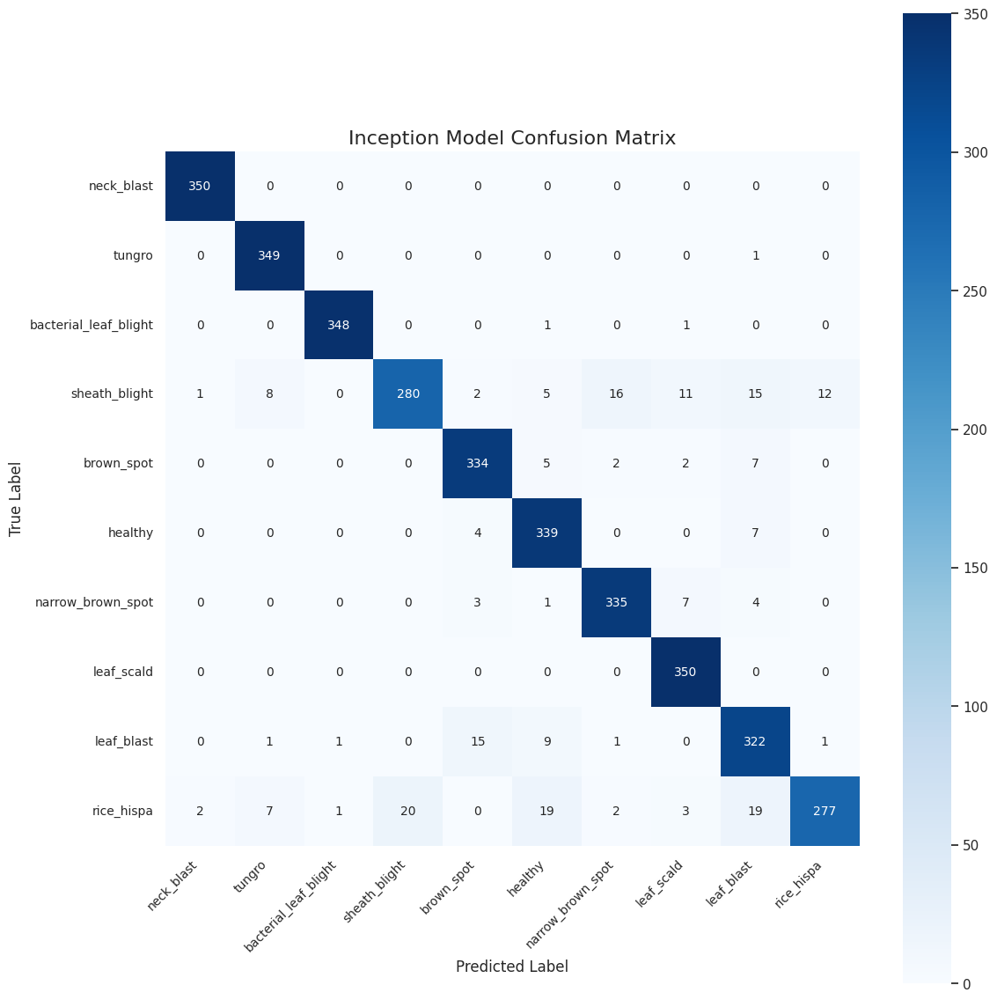

In [19]:

# Generate the confusion matrix
cm = confusion_matrix(Y_test, Y_pred)
cm_df = pd.DataFrame(cm, index=categories, columns=categories)

# Plot and save the confusion matrix with enhanced styling
plt.figure(figsize=(12, 12))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', cbar=True, square=True,
            annot_kws={"size": 10}, linewidths=0.0, linecolor='gray')

plt.title('Inception Model Confusion Matrix', fontsize=16)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Save and display the plot
plt.tight_layout()
plt.show()


110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step


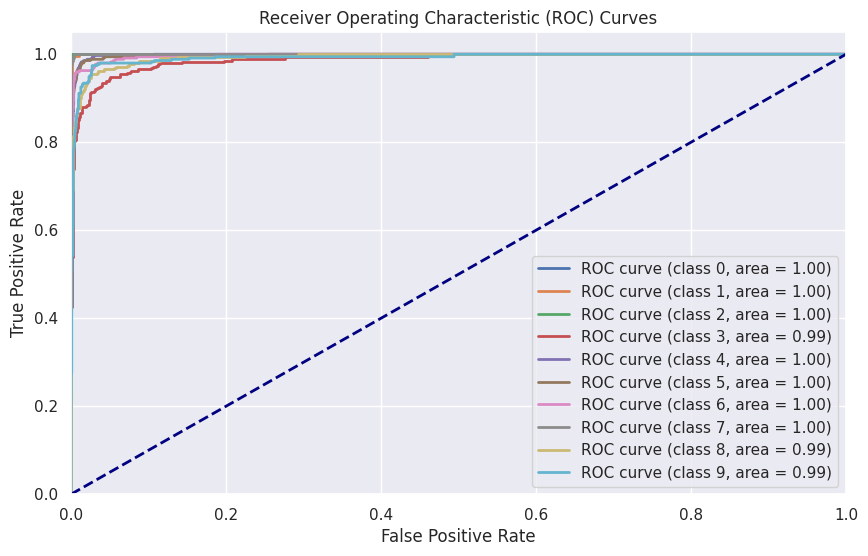

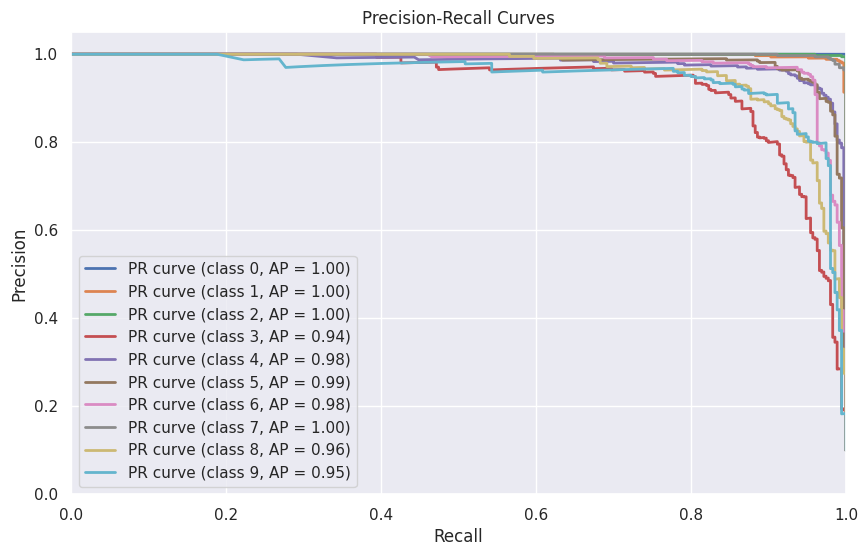

In [20]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve
model_output = inception_model.predict(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
precision = dict()
recall = dict()
average_precision = dict()

for i in range(num_categories):
    fpr[i], tpr[i], _ = roc_curve(Y_test == i, model_output[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    precision[i], recall[i], _ = precision_recall_curve(Y_test == i, model_output[:, i])
    average_precision[i] = auc(recall[i], precision[i])

# Plot ROC curves
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
for i in range(num_categories):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve (class {i}, area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="best")
plt.show()

# Plot PR curves
plt.figure(figsize=(10, 6))
for i in range(num_categories):
    plt.plot(recall[i], precision[i], lw=2, label=f'PR curve (class {i}, AP = {average_precision[i]:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend(loc="best")
plt.show()

In [ ]:
del VGG16_model
import tensorflow as tf
tf.keras.backend.clear_session()
import gc
gc.collect()

VGG16

In [12]:
from keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Flatten, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam, AdamW, Nadam, RMSprop, SGD

# Define input shape explicitly
input_tensor = Input(shape=(img_size, img_size, 3))

# Load VGG16 without the classification layers
VGG16_basic_model = VGG16(weights="imagenet", include_top=False, input_tensor=input_tensor)

# Freeze all layers of the pre-trained model
# for layer in VGG16_basic_model.layers:
#     layer.trainable = False

for layer in VGG16_basic_model.layers[:-10]:  # Keep first layers frozen, fine-tune last 10 layers
    layer.trainable = False
for layer in VGG16_basic_model.layers[-10:]:
    layer.trainable = True

# Add custom classification layers
x = Flatten()(VGG16_basic_model.output)  # Flatten the output of VGG16
x = Dense(256, activation='relu')(x)
# x = BatchNormalization()(x)
x = Dropout(0.5)(x)
output_tensor = Dense(num_categories, activation='softmax')(x)

# Create the final model
VGG16_model = Model(inputs=input_tensor, outputs=output_tensor)

VGG16_model.summary()
# Compile with a smaller learning rate for fine-tuning
VGG16_model.compile(
    optimizer=Nadam(learning_rate=0.0001),  # Small learning rate for fine-tuning
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)



58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       2,097,408 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 16,814,666 (64.14 MB)

 Trainable params: 15,669,258 (59.77 MB)

 Non-trainable params: 1,145,408 (4.37 MB)

In [13]:
VGG16 = VGG16_model.fit(
    x=X_train,
    y=Y_train,
    epochs=100,
    validation_data=(X_test, Y_test),
    batch_size=64
)

Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - accuracy: 0.5861 - loss: 1.1911 - val_accuracy: 0.8826 - val_loss: 0.3048
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - accuracy: 0.9011 - loss: 0.2767 - val_accuracy: 0.9366 - val_loss: 0.2137
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - accuracy: 0.9484 - loss: 0.1588 - val_accuracy: 0.9606 - val_loss: 0.1439
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - accuracy: 0.9636 - loss: 0.1105 - val_accuracy: 0.9389 - val_loss: 0.2189
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - accuracy: 0.9728 - loss: 0.0912 - val_accuracy: 0.9614 - val_loss: 0.1325
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - accuracy: 0.9753 - loss: 0.0707 - val_accuracy: 0.9354 - val_loss: 0.1946
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - accuracy: 0.9854 - loss: 0.0470 - val_accuracy: 0.9489 - val_loss: 0.1910
Epoch 8/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - accuracy: 0.9867 - loss: 

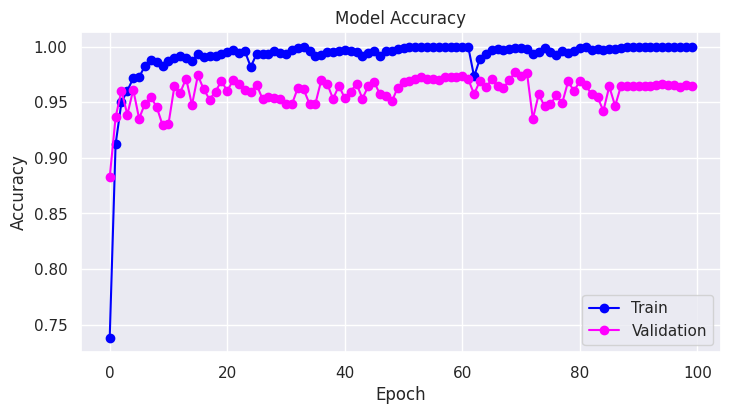

In [14]:
import seaborn as sns
#  "Accuracy"
plt.figure(figsize=[8, 4])
sns.set_theme()
plt.plot(VGG16.history['accuracy'], 'o-',color="blue")
plt.plot(VGG16.history['val_accuracy'] ,'o-', color="magenta")
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
#plt.show()
plt.gca().set_position([0.1, 0.12, 0.8, 0.8])
#plt.close()

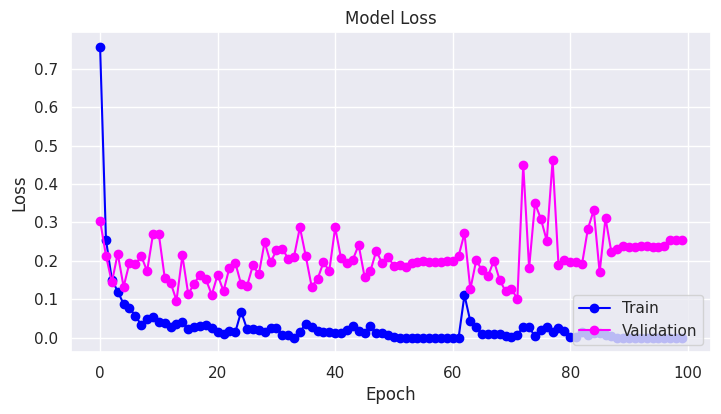

In [15]:
import seaborn as sns
#  "Accuracy"
plt.figure(figsize=[8, 4])
sns.set_theme()
plt.plot(VGG16.history['loss'], 'o-',color="blue")
plt.plot(VGG16.history['val_loss'] ,'o-', color="magenta")
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
#plt.show()
plt.gca().set_position([0.1, 0.12, 0.8, 0.8])
#plt.close()



In [17]:

test_loss, test_acc, *_ = VGG16_model.evaluate(X_test, Y_test) # Use _ to ignore additional return values
train_loss, train_acc, *_= VGG16_model.evaluate(X_train, Y_train) # Use _ to ignore additional return values

print("\n....................TRAIN ACCURACY.....................")


# cnn_train_accuracy = train_acc
print('\nTrain Accuracy:', train_acc)

# cnn_train_loss = train_loss
print('Train Loss:', train_loss)


print("\n....................TEST ACCURACY.....................")

# cnn_test_accuracy = test_acc
print('\nTest Accuracy:', test_acc)

# cnn_test_loss = test_loss
print('Test Loss:', test_loss)



110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.9802 - loss: 0.1563
438/438 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - accuracy: 1.0000 - loss: 8.0947e-08

....................TRAIN ACCURACY.....................

Train Accuracy: 1.0
Train Loss: 1.2312192154695367e-07

....................TEST ACCURACY.....................

Test Accuracy: 0.9651428461074829
Test Loss: 0.25447070598602295


In [16]:

# Make predictions
Y_pred_prob = VGG16_model.predict(X_test)

# Convert predicted probabilities to class labels
Y_pred = np.argmax(Y_pred_prob, axis=-1)

# Generate and print the classification report
print("Classification Report:\n")
print(classification_report(Y_test, Y_pred, target_names=categories))


# cnn_classification_report = os.path.join(cnn_result_path, 'Proposed_Cnn_classification_report.txt')

# with open(cnn_classification_report, 'w') as f:
#     f.write("Classification Report:\n")
#     f.write(classification_report(Y_test, Y_pred, target_names=categories))


110/110 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step
Classification Report:

                       precision    recall  f1-score   support

           neck_blast       1.00      1.00      1.00       350
               tungro       0.98      1.00      0.99       350
bacterial_leaf_blight       1.00      1.00      1.00       350
        sheath_blight       0.97      0.84      0.90       350
           brown_spot       0.97      0.99      0.98       350
              healthy       0.92      1.00      0.96       350
    narrow_brown_spot       0.98      0.99      0.99       350
           leaf_scald       0.94      1.00      0.97       350
           leaf_blast       0.96      0.97      0.96       350
           rice_hispa       0.95      0.86      0.90       350

             accuracy                           0.97      3500
            macro avg       0.97      0.97      0.96      3500
         weighted avg       0.97      0.97      0.96      3500



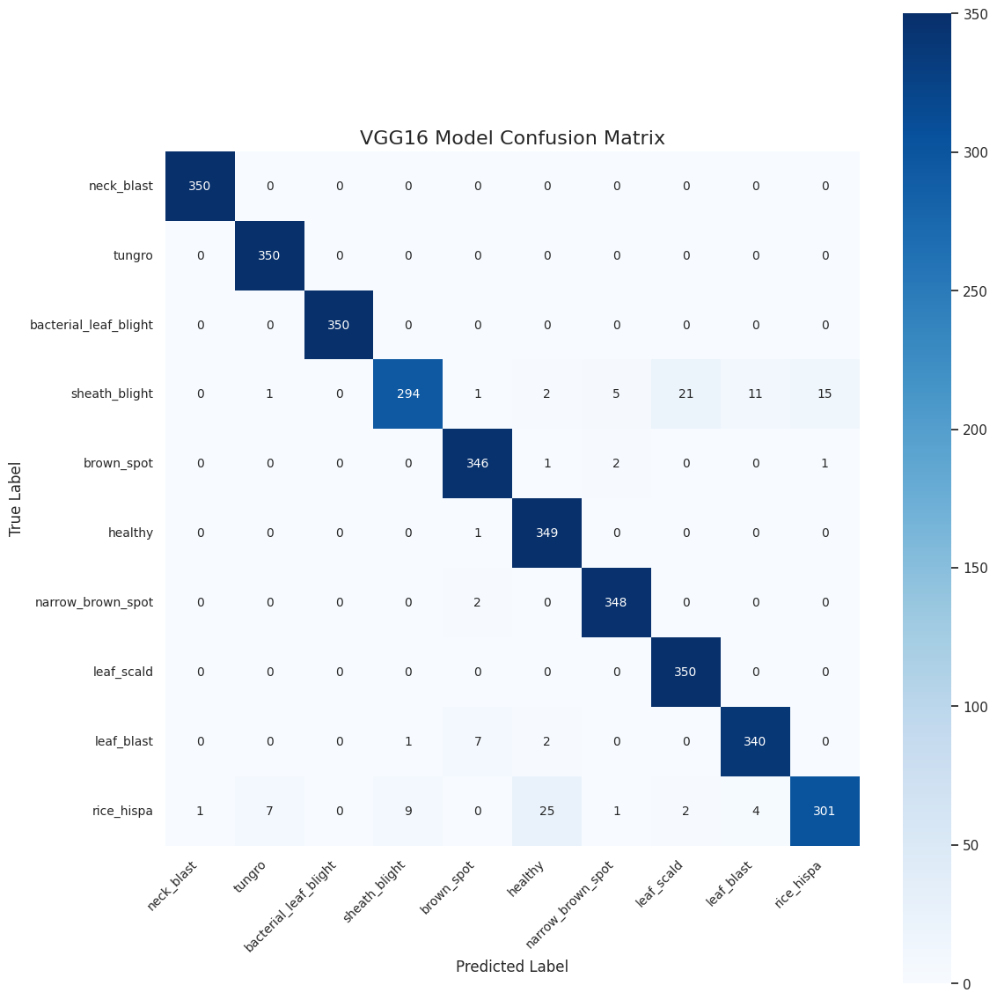

In [21]:

# Generate the confusion matrix
cm = confusion_matrix(Y_test, Y_pred)
cm_df = pd.DataFrame(cm, index=categories, columns=categories)

# Plot and save the confusion matrix with enhanced styling
plt.figure(figsize=(12, 12))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', cbar=True, square=True,
            annot_kws={"size": 10}, linewidths=0.0, linecolor='gray')

plt.title('VGG16 Model Confusion Matrix', fontsize=16)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Save and display the plot
plt.tight_layout()
plt.show()


110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step


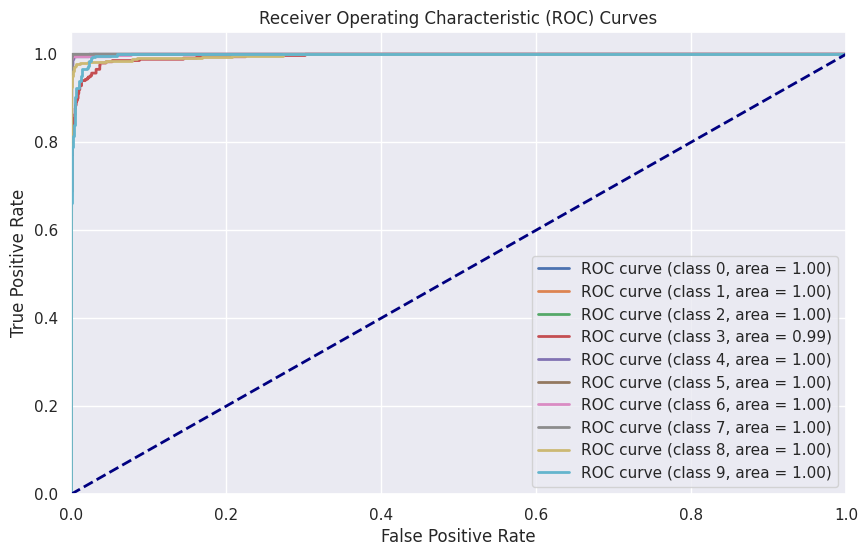

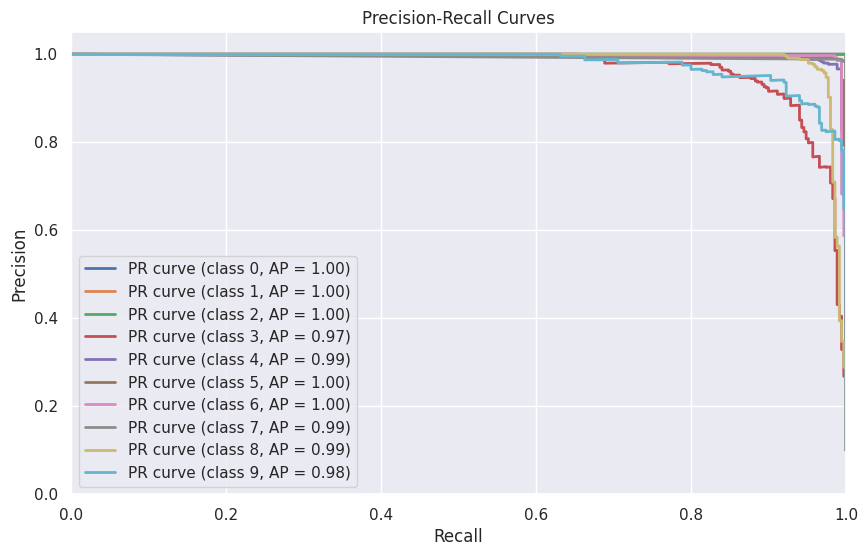

In [19]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve
model_output = VGG16_model.predict(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
precision = dict()
recall = dict()
average_precision = dict()

for i in range(num_categories):
    fpr[i], tpr[i], _ = roc_curve(Y_test == i, model_output[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    precision[i], recall[i], _ = precision_recall_curve(Y_test == i, model_output[:, i])
    average_precision[i] = auc(recall[i], precision[i])

# Plot ROC curves
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
for i in range(num_categories):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve (class {i}, area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="best")
plt.show()

# Plot PR curves
plt.figure(figsize=(10, 6))
for i in range(num_categories):
    plt.plot(recall[i], precision[i], lw=2, label=f'PR curve (class {i}, AP = {average_precision[i]:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend(loc="best")
plt.show()

Hybrid Vit

In [20]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, GlobalAveragePooling1D, Dense
from tensorflow.keras.models import Model

# Define Patch Embedding Layer
class PatchEmbedding(layers.Layer):
    def __init__(self, patch_size, projection_dim):
        super(PatchEmbedding, self).__init__()
        self.patch_size = patch_size
        self.projection_dim = projection_dim
        self.conv = Conv2D(projection_dim, patch_size, strides=patch_size, padding='valid')

    def call(self, images):
        batch_size = tf.shape(images)[0]
        height = tf.shape(images)[1]
        width = tf.shape(images)[2]
        
        # Split image into patches
        patches = self.conv(images)
        
        # Reshape patches to [batch_size, num_patches, projection_dim]
        patches = tf.reshape(patches, [batch_size, -1, self.projection_dim])
        
        return patches


# Define Transformer Encoder Layer with L2 Regularization
class TransformerEncoder(layers.Layer):
    def __init__(self, num_heads=4, ff_dim=512, dropout_rate=0.1, l2_reg=1e-4):
        super(TransformerEncoder, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=64)
        self.norm1 = layers.LayerNormalization()

        # Apply L2 regularization to the Dense layers
        regularizer = tf.keras.regularizers.l2(l2_reg)
        self.ffn = models.Sequential([
            layers.Dense(ff_dim, activation='relu', kernel_regularizer=regularizer),
            layers.Dense(ff_dim, kernel_regularizer=regularizer)  # Output size set to 768 to match attention output size
        ])
        
        self.norm2 = layers.LayerNormalization()
        self.dropout = layers.Dropout(dropout_rate)

    def call(self, inputs):
        # Self-attention mechanism
        attention_output = self.attention(inputs, inputs)
        attention_output = self.dropout(attention_output)
        attention_output = self.norm1(inputs + attention_output)

        # Feedforward network
        ffn_output = self.ffn(attention_output)
        ffn_output = self.dropout(ffn_output)
        return self.norm2(attention_output + ffn_output)


# Build the Hybrid ViT Model
def build_vit_hybrid_model(img_size, num_categories, projection_dim=512, patch_size=8, num_transformer_layers=1, l2_reg=1e-4):
    inputs = Input(shape=(img_size, img_size, 3))
    
    # Backbone: CNN (ResNet, EfficientNet, etc.) features as the input
    cnn_features = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    cnn_features = MaxPooling2D((2, 2))(cnn_features)
    cnn_features = Conv2D(128, (3, 3), activation='relu', padding='same')(cnn_features)
    cnn_features = MaxPooling2D((2, 2))(cnn_features)
    cnn_features = Conv2D(256, (3, 3), activation='relu', padding='same')(cnn_features)
    cnn_features = MaxPooling2D((2, 2))(cnn_features)

    # Add Patch Embedding layer
    patch_embed = PatchEmbedding(patch_size=patch_size, projection_dim=projection_dim)(cnn_features)
    
    # Add Transformer Encoder layers
    for _ in range(num_transformer_layers):
        patch_embed = TransformerEncoder(l2_reg=l2_reg)(patch_embed)

    # Final classification head using GlobalAveragePooling1D
    x = GlobalAveragePooling1D()(patch_embed)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.4)(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.4)(x)
    output = Dense(num_categories, activation='softmax')(x)

    model = Model(inputs, output)
    return model


# Define model parameters
img_size = 144  # Image size (128x128)
num_categories = 10  # Number of classes (from the dataset)
projection_dim = 512  # Projection dimension for Patch Embedding
patch_size = 8  # Patch size
num_transformer_layers = 1  # Number of Transformer Encoder layers
l2_reg = 1e-4  # L2 Regularization strength

# Build the model
vit_hybrid_model = build_vit_hybrid_model(img_size, num_categories, projection_dim, patch_size, num_transformer_layers, l2_reg)

# Compile the model
vit_hybrid_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                         loss='sparse_categorical_crossentropy', 
                         metrics=['accuracy'])

# Model summary
vit_hybrid_model.summary()




Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 144, 144, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 144, 144, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 72, 72, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 72, 72, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 36, 36, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 36, 36, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 18, 18, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ patch_embedding (PatchEmbedding)     │ (None, None, 512)           │       8,389,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ transformer_encoder                  │ (None, None, 512)           │       1,052,928 │
│ (TransformerEncoder)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling1d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling1D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1024)                │         525,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1024)                │       1,049,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 10)                  │          10,250 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,398,026 (43.48 MB)

 Trainable params: 11,398,026 (43.48 MB)

 Non-trainable params: 0 (0.00 B)

In [21]:
# Assuming you have the following variables ready:
# - X_train, Y_train: Training images and labels
# - X_val, Y_val: Validation images and labels

# Train the model
history = vit_hybrid_model.fit(
    X_train, Y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_test, Y_test),
    verbose=2
)

# Save the trained model
vit_hybrid_model.save('vit_hybrid_model_with_l2_reg.h5')

# # Optionally, you can save the history for plotting or analysis
# import pickle
# with open('training_history_with_l2_reg.pkl', 'wb') as f:
#     pickle.dump(history.history, f)


Epoch 1/100
438/438 - 44s - 101ms/step - accuracy: 0.5127 - loss: 1.4851 - val_accuracy: 0.7420 - val_loss: 0.7950
Epoch 2/100
438/438 - 16s - 38ms/step - accuracy: 0.7409 - loss: 0.8172 - val_accuracy: 0.8189 - val_loss: 0.5939
Epoch 3/100
438/438 - 17s - 38ms/step - accuracy: 0.8071 - loss: 0.6294 - val_accuracy: 0.8771 - val_loss: 0.4324
Epoch 4/100
438/438 - 16s - 38ms/step - accuracy: 0.8419 - loss: 0.5394 - val_accuracy: 0.9054 - val_loss: 0.3414
Epoch 5/100
438/438 - 16s - 38ms/step - accuracy: 0.8778 - loss: 0.4294 - val_accuracy: 0.9031 - val_loss: 0.3463
Epoch 6/100
438/438 - 16s - 38ms/step - accuracy: 0.9015 - loss: 0.3616 - val_accuracy: 0.9011 - val_loss: 0.3601
Epoch 7/100
438/438 - 17s - 38ms/step - accuracy: 0.9224 - loss: 0.3054 - val_accuracy: 0.9117 - val_loss: 0.3698
Epoch 8/100
438/438 - 16s - 38ms/step - accuracy: 0.9378 - loss: 0.2573 - val_accuracy: 0.9380 - val_loss: 0.2698
Epoch 9/100
438/438 - 16s - 38ms/step - accuracy: 0.9562 - loss: 0.2148 - val_accuracy:

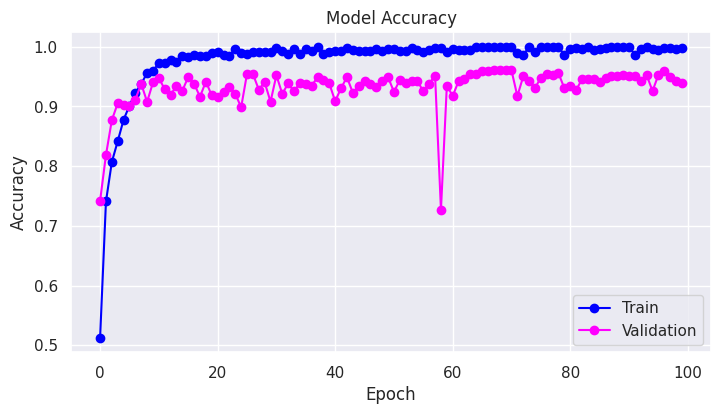

In [22]:
import seaborn as sns
#  "Accuracy"
plt.figure(figsize=[8, 4])
sns.set_theme()
plt.plot(history.history['accuracy'], 'o-',color="blue")
plt.plot(history.history['val_accuracy'] ,'o-', color="magenta")
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
#plt.show()
plt.gca().set_position([0.1, 0.12, 0.8, 0.8])
#plt.close()

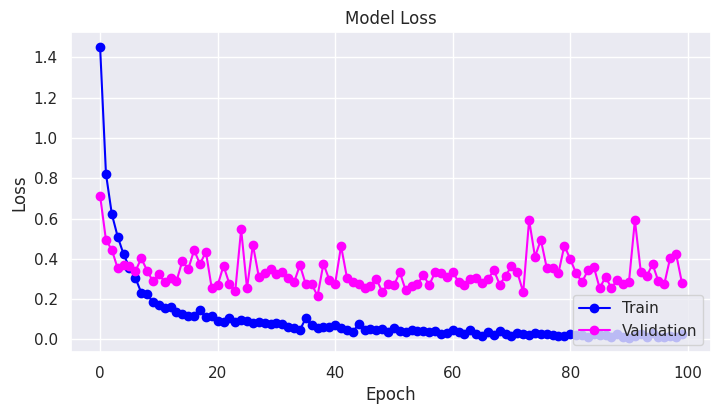

In [25]:
import seaborn as sns
#  "Accuracy"
plt.figure(figsize=[8, 4])
sns.set_theme()
plt.plot(history.history['loss'], 'o-',color="blue")
plt.plot(history.history['val_loss'] ,'o-', color="magenta")
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
#plt.show()
plt.gca().set_position([0.1, 0.12, 0.8, 0.8])
#plt.close()



In [27]:

h_test_loss, h_test_acc, *_ = vit_hybrid_model.evaluate(X_test, Y_test) # Use _ to ignore additional return values
h_train_loss, h_train_acc, *_= vit_hybrid_model.evaluate(X_train, Y_train) # Use _ to ignore additional return values

print("\n....................TRAIN ACCURACY.....................")


# cnn_train_accuracy = train_acc
print('\nTrain Accuracy:', h_train_acc)

# cnn_train_loss = train_loss
print('Train Loss:', h_train_loss)


print("\n....................TEST ACCURACY.....................")

# cnn_test_accuracy = test_acc
print('\nTest Accuracy:', h_test_acc)

# cnn_test_loss = test_loss
print('Test Loss:', h_test_loss)



110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9744 - loss: 0.1351
438/438 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.9999 - loss: 0.0061

....................TRAIN ACCURACY.....................

Train Accuracy: 0.9997857213020325
Train Loss: 0.006543267052620649

....................TEST ACCURACY.....................

Test Accuracy: 0.9511428475379944
Test Loss: 0.28173553943634033


In [34]:

# Make predictions
Y_pred_prob = vit_hybrid_model.predict(X_test)

# Convert predicted probabilities to class labels
Y_pred = np.argmax(Y_pred_prob, axis=-1)

# Generate and print the classification report
print("Classification Report:\n")
print(classification_report(Y_test, Y_pred, target_names=categories))


# cnn_classification_report = os.path.join(cnn_result_path, 'Proposed_Cnn_classification_report.txt')

# with open(cnn_classification_report, 'w') as f:
#     f.write("Classification Report:\n")
#     f.write(classification_report(Y_test, Y_pred, target_names=categories))


110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step
Classification Report:

                       precision    recall  f1-score   support

           neck_blast       0.99      1.00      1.00       350
               tungro       0.99      1.00      0.99       350
bacterial_leaf_blight       0.99      0.99      0.99       350
        sheath_blight       0.99      0.87      0.92       350
           brown_spot       0.88      0.97      0.92       350
              healthy       0.88      0.95      0.91       350
    narrow_brown_spot       0.96      0.98      0.97       350
           leaf_scald       0.97      1.00      0.99       350
           leaf_blast       0.91      0.83      0.87       350
           rice_hispa       0.96      0.93      0.94       350

             accuracy                           0.95      3500
            macro avg       0.95      0.95      0.95      3500
         weighted avg       0.95      0.95      0.95      3500



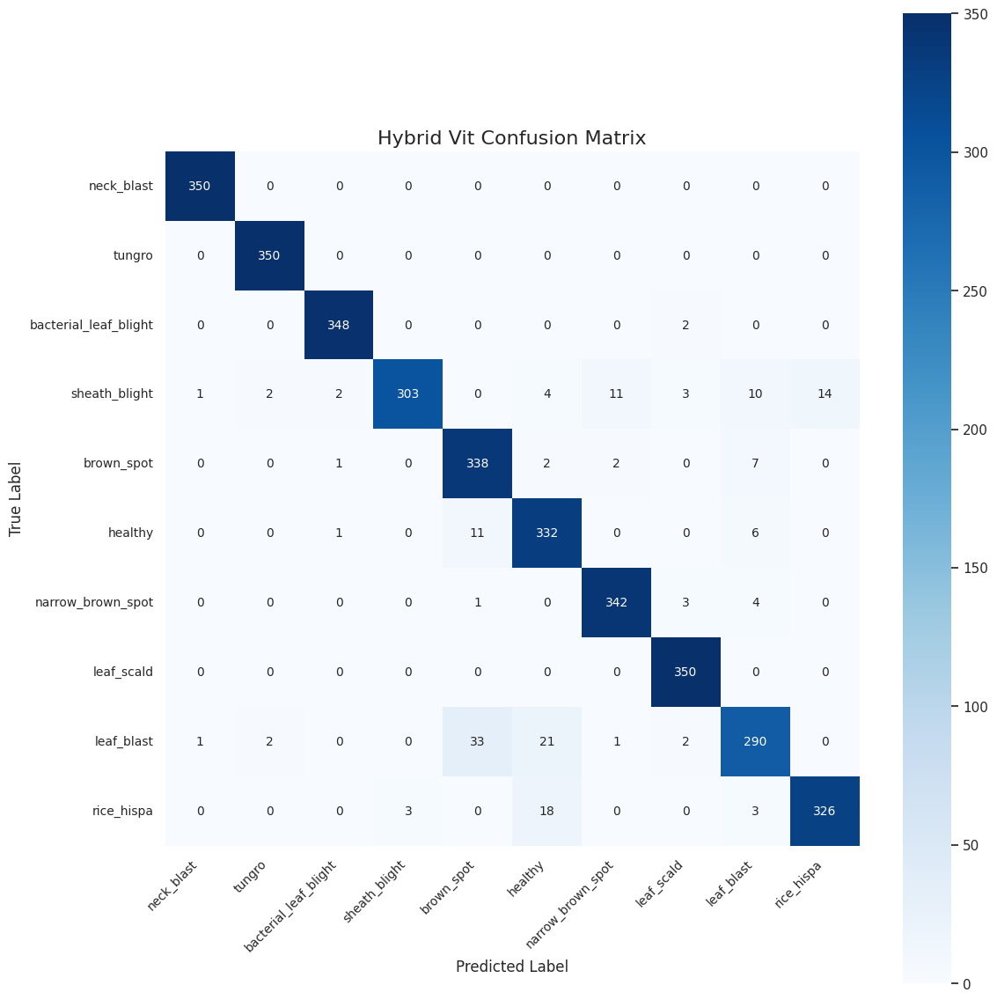

In [36]:

# Generate the confusion matrix
cm = confusion_matrix(Y_test, Y_pred)
cm_df = pd.DataFrame(cm, index=categories, columns=categories)

# Plot and save the confusion matrix with enhanced styling
plt.figure(figsize=(12, 12))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', cbar=True, square=True,
            annot_kws={"size": 10}, linewidths=0.0, linecolor='gray')

plt.title('Hybrid Vit Confusion Matrix', fontsize=16)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Save and display the plot
plt.tight_layout()
plt.show()


110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step


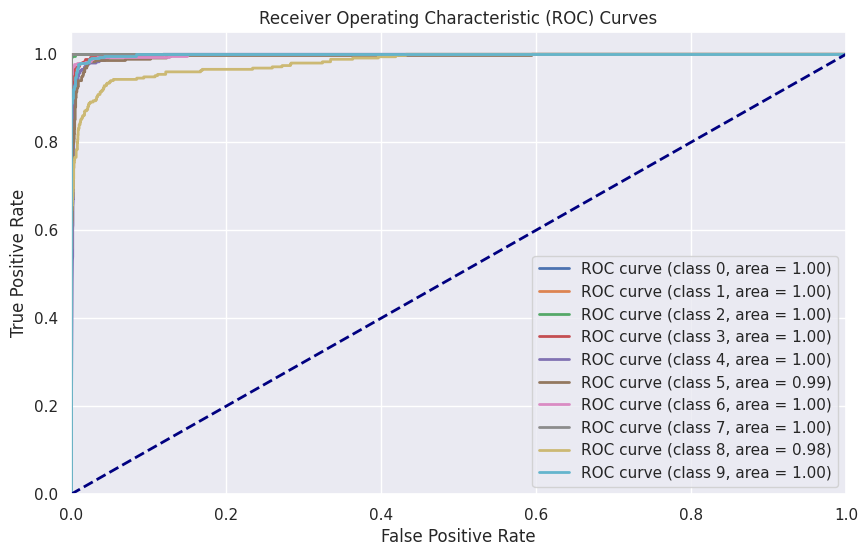

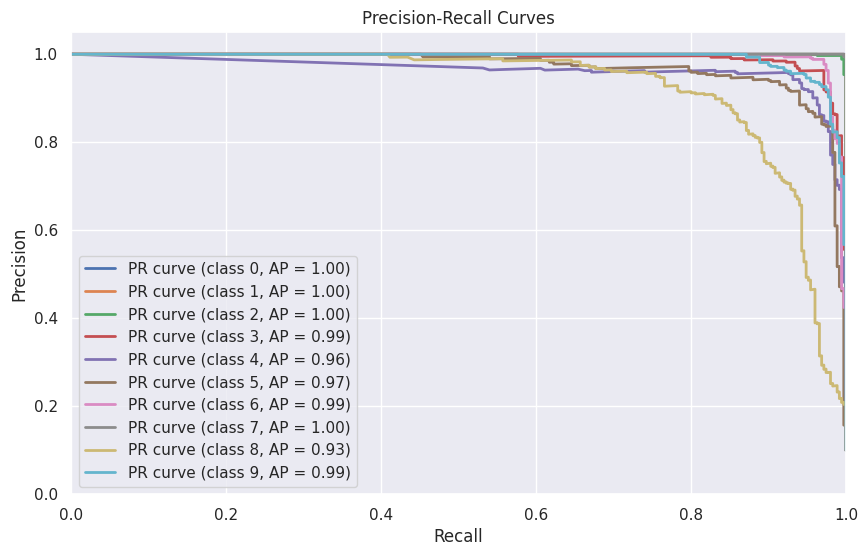

In [37]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve
model_output = vit_hybrid_model.predict(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
precision = dict()
recall = dict()
average_precision = dict()

for i in range(num_categories):
    fpr[i], tpr[i], _ = roc_curve(Y_test == i, model_output[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    precision[i], recall[i], _ = precision_recall_curve(Y_test == i, model_output[:, i])
    average_precision[i] = auc(recall[i], precision[i])

# Plot ROC curves
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
for i in range(num_categories):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve (class {i}, area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="best")
plt.show()

# Plot PR curves
plt.figure(figsize=(10, 6))
for i in range(num_categories):
    plt.plot(recall[i], precision[i], lw=2, label=f'PR curve (class {i}, AP = {average_precision[i]:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend(loc="best")
plt.show()

Generating Grad-CAM for class: neck_blast


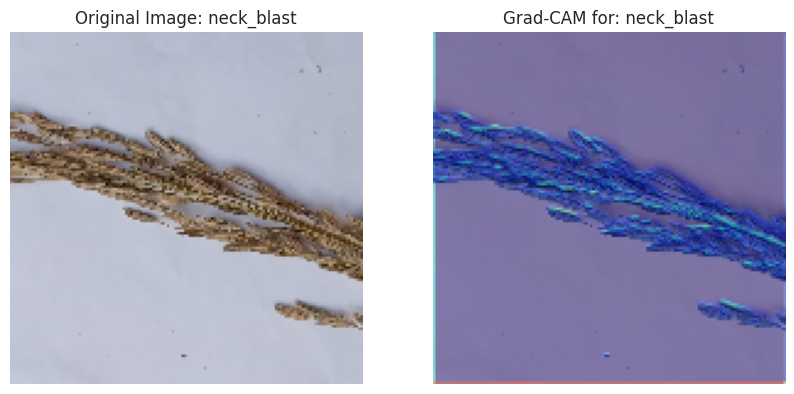

Generating Grad-CAM for class: tungro


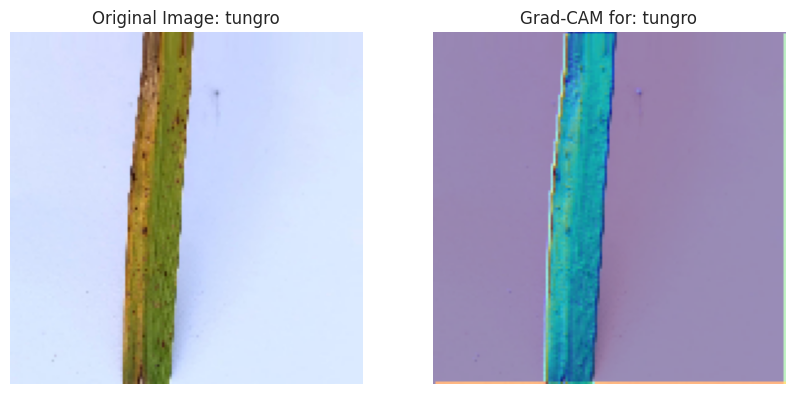

Generating Grad-CAM for class: bacterial_leaf_blight


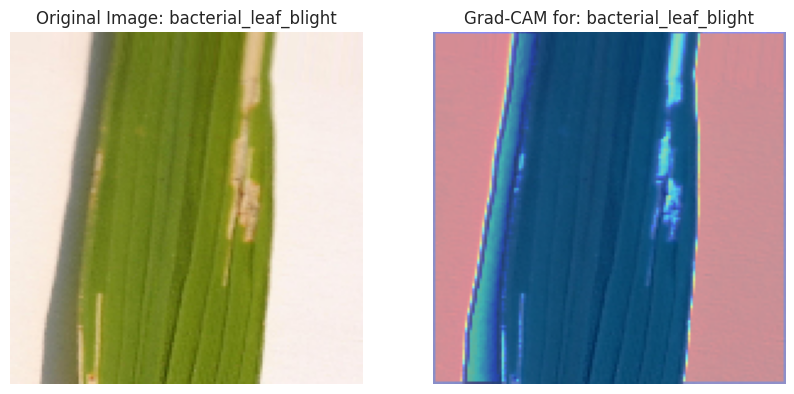

Generating Grad-CAM for class: sheath_blight


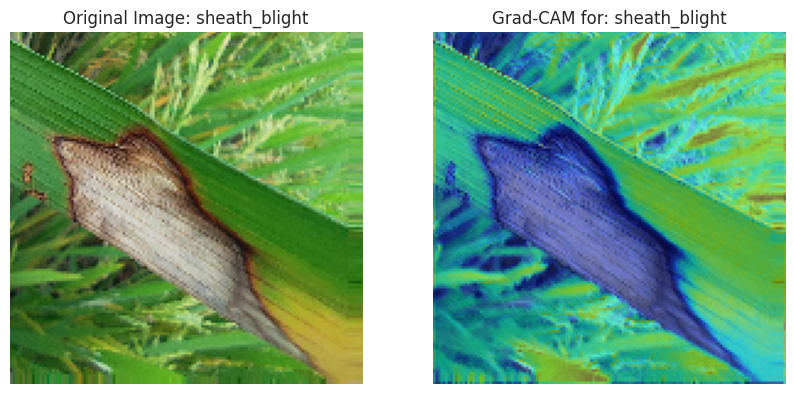

Generating Grad-CAM for class: brown_spot


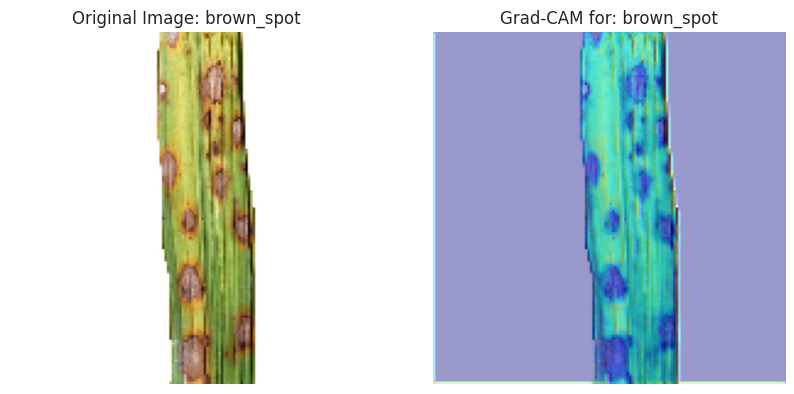

Generating Grad-CAM for class: healthy


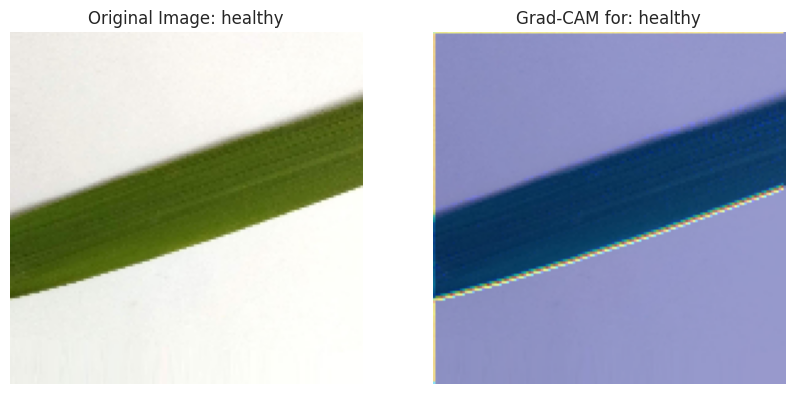

Generating Grad-CAM for class: narrow_brown_spot


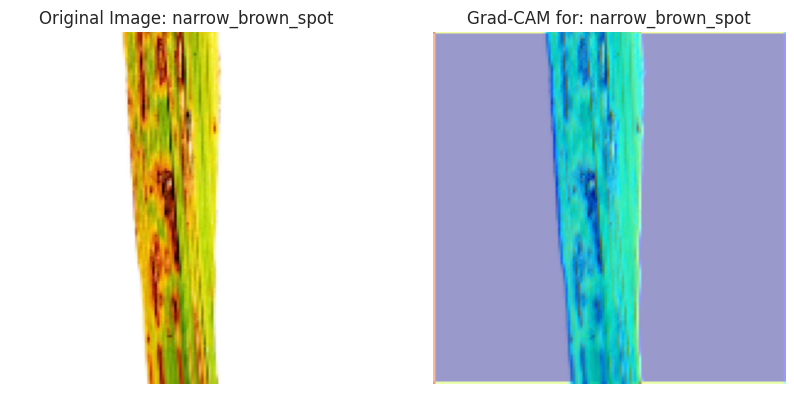

Generating Grad-CAM for class: leaf_scald


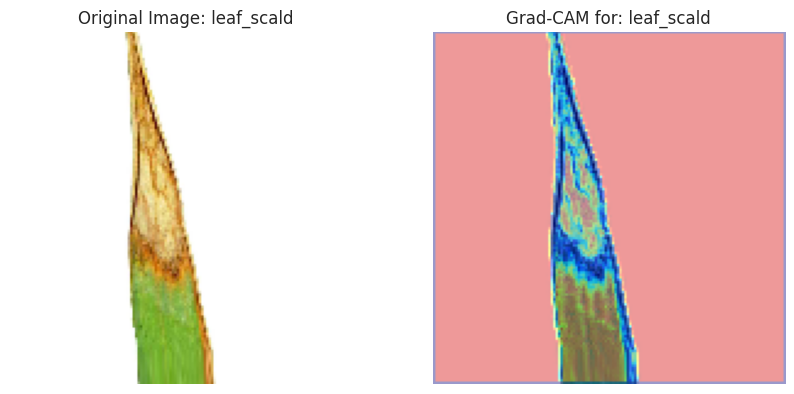

Generating Grad-CAM for class: leaf_blast


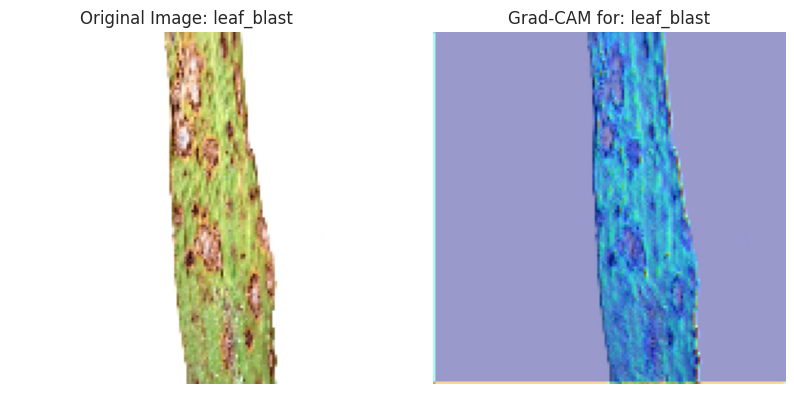

Generating Grad-CAM for class: rice_hispa


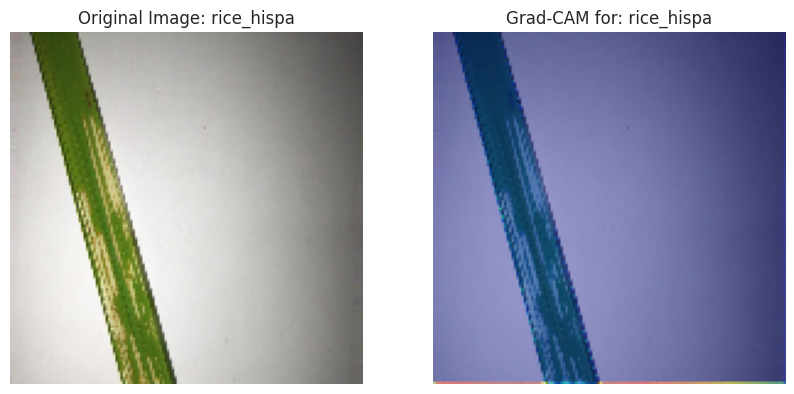

In [23]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model

# Define the path to the validation data
valid_folder = '/kaggle/input/test-data/test_1'

# Get the list of classes (subdirectories) in the validation folder
classes = os.listdir(valid_folder)

# Load your pre-trained model (replace with your model's variable name)
model = vit_hybrid_model  # Replace with the model you have defined

# Define the last convolution layer name
last_conv_layer_name = 'conv2d'  # Example, change if different in your model

# Function to generate Grad-CAM heatmap
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# Function to apply Grad-CAM for each image in a class (only 3 images per class)
def apply_gradcam_to_class(class_name, model, last_conv_layer_name, img_size=144, num_images=3):
    class_folder = os.path.join(valid_folder, class_name)
    image_files = os.listdir(class_folder)[:num_images]  # Get the first 'num_images' images

    # Loop through the first 'num_images' images in the class folder
    for img_name in image_files:
        img_path = os.path.join(class_folder, img_name)
        
        # Load the image and preprocess
        img = image.load_img(img_path, target_size=(img_size, img_size))
        img_array = image.img_to_array(img) / 255.0  # Normalize image
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        
        # Generate Grad-CAM heatmap
        heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

        # Superimpose the heatmap on the image
        heatmap = cv2.resize(heatmap, (img_size, img_size))
        heatmap = np.uint8(255 * heatmap)
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(np.uint8(img_array[0] * 255), 0.6, heatmap, 0.4, 0)

        # Display the original image and Grad-CAM
        plt.figure(figsize=(10, 6))

        # Show the original image
        plt.subplot(1, 2, 1)
        plt.imshow(img)
        plt.title(f"Original Image: {class_name}")
        plt.axis('off')

        # Show the Grad-CAM image
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Grad-CAM for: {class_name}")
        plt.axis('off')

        # Display the plots
        plt.show()

# Apply Grad-CAM for the first 3 images in each class in the validation set
for class_name in classes:
    print(f"Generating Grad-CAM for class: {class_name}")
    apply_gradcam_to_class(class_name, model, last_conv_layer_name)